<img src="https://baobab.deeplearningindaba.com/static/media/indaba-logo-dark.d5a6196d.png" width="50%" />

# De l'entraînement centralisé à l'entraînement décentralisé : une introduction au Federated Learning



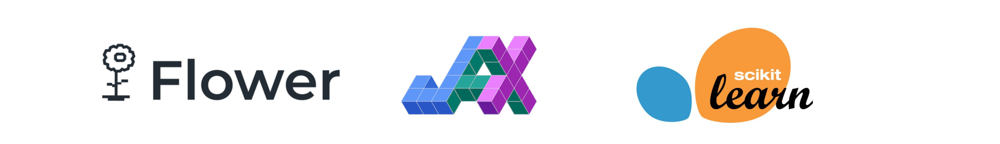





© Deep Learning Indaba 2024. Apache License 2.0.

**Auteurs:** *Andrej Jovanović*, *Sree Harsha Nelaturu* et *Luca Powell*

**Réviseurs:** *TBD*

### **Sujets:**
<font color='grey'>`Federated Learning`</font>  <font color='grey'>`Réseaux de neurones`</font> <font color='grey'>`Machine Learning`</font>

### **Objectifs/Objectifs d'apprentissage:**

Le Federated Learning (FL) est un domaine de recherche en pleine croissance avec un certain nombre d'applications existantes et de nombreux articles de recherche présentés chaque année lors de conférences, dans des revues et des ateliers. Bien que cela soit bénéfique pour les experts de la recherche et de l'industrie qui disposent d'une communauté FL florissante, les innovations rapides dans le domaine du FL créent implicitement une barrière à l'entrée pour ceux qui souhaitent entrer dans cet espace et comprendre le FL à partir des premiers principes. Bien que le FL soit un concept relativement simple à la base, il peut être mis en œuvre de nombreuses façons et comprend un grand nombre de jargons spécifiques au domaine qui peuvent laisser les nouveaux arrivants se sentir dépassés ou aliénés au départ. Notre approche pratique vise à combler cette lacune. Nous voulons fournir une introduction au FL axée sur les débutants, en supprimant toutes les fioritures afin que l'accent soit mis sur les concepts fondamentaux. Nous voulons que vous quittiez cette formation pratique avec une compréhension suffisante pour pouvoir expliquer le Federated Learning à quelqu'un d'autre et pour pouvoir deviner quand le Federated Learning pourrait être utile dans les futurs scénarios que vous pourriez rencontrer.

Officiellement, nous visons à atteindre les objectifs suivants:
1. Fournir une compréhension intuitive des premiers principes du Federated Learning.
2. Clarifier la terminologie FL courante dans la littérature avec des exemples.
3. Souligner les différences entre l'entraînement centralisé et l'entraînement décentralisé.
4. Fournir une introduction à Flower, un puissant framework open-source de Federated Learning.

### **Prérequis:**

Nous avons essayé de rendre cette formation pratique aussi introductive que possible. Nous présentons les bases du Federated Learning et supposons que vous avez une compréhension de base des principes et des outils suivants en matière de machine learning :

* Python
* NumPy
* Théorie des probabilités de base
* Connaissance du machine learning classique, par exemple les problèmes de régression et de classification
* Réseaux de neurones

Niveau d'expérience suggéré dans ce sujet: <font color='grey'>`Débutant`</font>

<div style="display: inline-block">
    
| Niveau         | Expérience                            |
| :-- | :-- |
| `Débutant`      | C'est la première fois que je suis initié à ce travail. |
| `Intermédiaire`  | J'ai suivi quelques cours/introductions de base sur ce sujet. |
| `Avancé`      | Je travaille quotidiennement dans ce domaine/sujet. |

</div>

### **Plan:**
La formation pratique sera structurée comme suit :

**Section 1 :** Une introduction au Federated Learning, vue sous l'angle d'un problème d'optimisation distribuée.

**Section 2 :** Explication des différents termes et jargons utilisés dans le Federated Learning.

**Section 3 :** Votre premier exemple de FL -- Régression non linéaire.

**Section 4 :** Comparaison directe entre l'entraînement centralisé et l'entraînement décentralisé à l'aide du Federated Learning.

## À FAIRE AVANT LA PRATIQUE : Installation et importations (Exécuter la cellule)

Nous allons installer certains packages pertinents dont nous avons besoin pour réaliser cette formation pratique. Ne vous inquiétez pas, ce n'est pas important pour votre compréhension. Nous devons simplement nous assurer que tout est configuré pour que vous soyez prêt à démarrer le jour J !


In [ ]:
%%capture
# Téléchargez les packages nécessaires - jax, sklearn, flower
!pip install jax jaxlib scikit-learn flwr_datasets optax flax ipywidgets torch torchvision "flwr[simulation]"

# Téléchargez les données localement
from datasets import load_dataset
load_dataset("zalando-datasets/fashion_mnist", cache_dir="./data")

## À FAIRE LORS DE LA PRATIQUE : Importer les packages requis. (Exécuter la cellule)



In [ ]:
import jax
import jax.numpy as jnp
from jax import grad, jit, vmap

import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
import tqdm

import jax.random as random
import optax
import flax
from flax import linen as nn
from flax.training import train_state
import functools

from typing import Dict, List, Tuple, Callable, NamedTuple, Any
from collections import OrderedDict

import matplotlib.pyplot as plt

from sklearn import datasets
from sklearn.preprocessing import MinMaxScaler

from datasets import load_dataset
from ipywidgets import interact

key = random.PRNGKey(42)

---
## Section 1: Introduction <a class="anchor" id="section-1"></a>
---

### 1.1 Qu'est-ce que le Federated Learning ?

Supposons que nous souhaitons entraîner un modèle de suggestion de mots suivants pour proposer des mots suivants utiles en fonction de ce qu'un utilisateur tape sur le clavier de son smartphone. Comment pouvons-nous faire en sorte que ce modèle apprenne de populations entières d'utilisateurs de smartphones sans exposer l'activité ou les habitudes de frappe d'un utilisateur spécifique (données hautement sensibles) ? C'est exactement le genre de problème qui a motivé l'émergence du **Federated Learning (FL)**. Le Federated Learning est une stratégie d'entraînement de modèles statistiques sur un certain nombre d'appareils distants, appelés ***clients***, sans accéder directement aux données des clients et donc en préservant la confidentialité des utilisateurs.

### 1.2 Alors, comment fonctionne le FL?

Contrairement au ML conventionnel qui utilise un entraînement ***centralisé*** (c'est-à-dire un entraînement sur des données pré-collectées et stockées sur un appareil ou un serveur central), le FL exploite plutôt un entraînement ***décentralisé***: un entraînement sur des données stockées de manière distribuée entre les clients. En effet, avec le FL, nous poussons le calcul vers la périphérie. Une autre façon de dire cela est que ce sont les appareils clients qui effectuent l'entraînement. Cela nous permet d'entraîner des modèles de ML tout en favorisant intrinsèquement la confidentialité, car les données d'entraînement n'ont jamais à quitter ces clients. Le problème central du FL est d'apprendre un seul modèle "global" à partir des données décentralisées des clients en communiquant les mises à jour du modèle client à un ***serveur de paramètres***. Un système FL serveur-client typique maintient un serveur centralisé qui synchronise l'entraînement à travers des itérations de ce que l'on appelle des ***rounds*** d'entraînement fédéré.

Un seul round FL se déroule généralement comme suit :

1. Au début d'un round, le serveur de paramètres envoie une copie du modèle global à chaque client.
2. Les clients entraînent chacun leur copie du modèle pendant un certain nombre d'époques locales sur leur ensemble de données local (les ensembles de données des clients sont appelés ***partitions***) et envoient les mises à jour du modèle post-entraînement au serveur.
3. Le serveur agrège ensuite tous les modèles clients mis à jour pour former une seule mise à jour de modèle fédéré ou _global_ qui constitue le modèle global pour le round suivant.

Cette procédure est illustrée ci-dessous.

Les approches conventionnelles de machine learning utilisent principalement un entraînement **centralisé**, où toutes les données d'entraînement sont pré-collectées et stockées sur un seul appareil (central) ou serveur. Cependant, cette configuration centralisée n'est pas toujours viable. Dans de nombreux cas, les données ne peuvent pas être transférées librement des emplacements de génération de données (appareils edge) vers un serveur central. Par exemple, le partage de données sensibles est restreint en raison de préoccupations liées à la confidentialité dans le domaine médical. Cela rend l'entraînement centralisé traditionnel inefficace. Pour résoudre ce problème, le Federated Learning, un cadre d'entraînement qui est l'inverse de l'entraînement centralisé, a été proposé. En effet, avec le Federated Learning, nous poussons le calcul vers la périphérie, ce qui nous permet d'entraîner des modèles de machine learning qui favorisent intrinsèquement la confidentialité, car les données d'entraînement ne quittent jamais l'appareil edge.

Le problème central du FL est d'apprendre un seul modèle global à partir des données décentralisées des clients en traitant ces données sur l'appareil et en communiquant les mises à jour de modèle correspondantes à un serveur de paramètres.

La forme la plus courante de FL est appelée _**cross-device FL**_. Il s'agit d'entraîner en collaboration des modèles sur des appareils edge ou des « clients » encapsulant leurs données privées. En tant que tel, le FL peut :
- Réduire les coûts de communication en ne partageant que les paramètres du modèle.
- Distribuer le calcul sur un pool d'appareils auparavant inutilisés.
- Préserver partiellement la confidentialité par défaut.


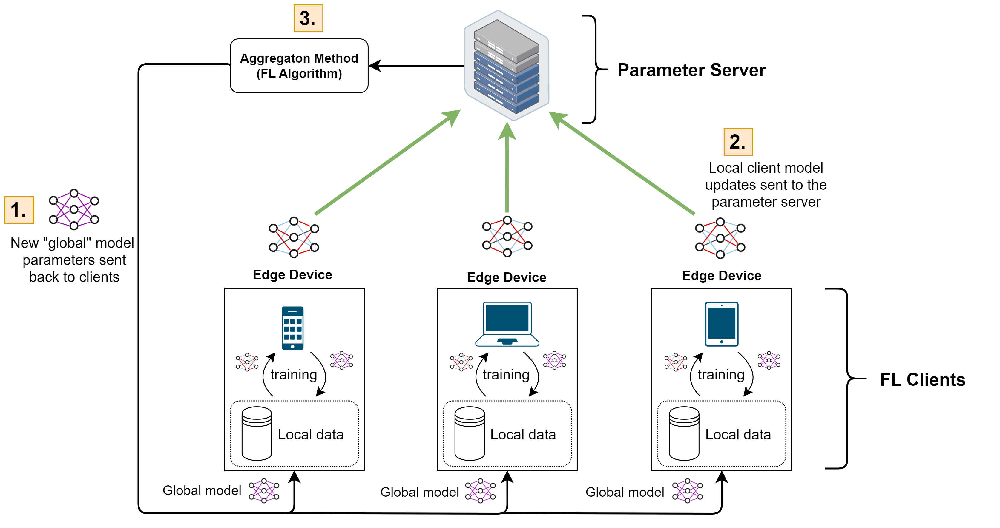

---
## Section 2: Concepts du Federated Learning <a class="anchor" id="section-2"></a>
---

### 2.1 Stratégies d'agrégation de modèles

Nous pouvons considérer le Federated Learning comme une tentative de résoudre un problème d'optimisation global (obtenir un modèle globalement performant) en résolvant un certain nombre d'objectifs d'optimisation plus petits (c'est-à-dire en minimisant les fonctions de perte de chaque client) en même temps. C'est là qu'intervient la notion d'agrégation de modèles. L'idée centrale est qu'un agrégat de toutes les petites étapes d'optimisation devrait aboutir à une étape globale vers l'objectif d'optimisation global.

#### Moyenne fédérée - La formulation de somme finie

La première forme d'agrégation de modèle proposée est la **moyenne fédérée (FedAvg)**. FedAvg peut être exprimé en utilisant la formulation de somme finie, où au lieu de résoudre plusieurs objectifs différents, nous résolvons un problème d'optimisation global qui est la moyenne pondérée des fonctions objectives individuelles :

$\min_{x} f(x) = \frac{1}{N}\sum_{i=1}^k n_i\cdot f_i(x) = \frac{\sum_{i=1}^k n_i\cdot f_i(x)}{\sum_{i=1}^k n_i}$

Faisons une comparaison avec la configuration du Federated Learning :

**$f(x)$** : Le modèle global que nous entraînons par agrégation au niveau du serveur de paramètres.

**$f_i(x)$** : Les modèles individuels que nous entraînons sur les clients (objectifs des clients).

**$k$** : Le nombre de clients.

**$n_i$** : Le nombre d'exemples d'entraînement appartenant à chaque client respectivement.

**$N$** : Le nombre total d'exemples d'entraînement sur tous les clients.

Notez que FedAvg inclut les restrictions suivantes pour une meilleure stabilité du modèle global :

* Un nombre cohérent d'époques locales entre les clients ; chaque client itère sur l'ensemble de son ensemble de données pour le nombre d'époques fourni.
* La pondération attribuée à l'objectif de tout client (c'est-à-dire la mise à jour du modèle) est proportionnelle à la taille relative de son ensemble de données local. Nous ne voudrions pas qu'un client avec seulement 5 exemples d'entraînement apporte la même contribution qu'un client avec 5000 exemples d'entraînement - pouvez-vous en deviner la raison ?


### 2.2 Hétérogénéité des données

La plus grande limitation de l'algorithme FedAvg est peut-être son hypothèse selon laquelle les partitions des clients sont ***indépendantes et identiquement distribuées*** **(IID)**. Cela signifie que nous supposons que les données de chaque client ont été générées à partir du même processus sous-jacent, ce qui signifie que si nous entraînons le modèle et qu'il fonctionne bien sur les données d'un client, cette performance se traduira bien sur d'autres clients non observés. Voyez-vous à quel point cette hypothèse est très optimiste ? Les données provenant de diverses sources (clients) sont naturellement différentes ou *hétérogènes* dans leurs propriétés, les partitions des clients sont donc susceptibles d'être non-IID les unes avec les autres. En résumé:

**Données IID :** Les données sont IID si la distribution de probabilité sous-jacente des points de données est la même et si chaque point est généré indépendamment les uns des autres.

**Données non IID :** Les données sont non IID si la distribution de probabilité sous-jacente des points de données est différente pour chaque client.

Le cas où les partitions des clients diffèrent en termes de distribution et d'autres propriétés est appelé ***Hétérogénéité des données***.

#### 2.2.1 Exemple non-IID - Pommes et oranges

Pour illustrer les données non-IID, considérons un scénario dans lequel nous voulons entraîner un réseau de neurones à distinguer les pommes et les oranges pour une chaîne de montage automatique dans une usine d'emballage de fruits. Si l'ensemble d'entraînement contient exclusivement des images de pommes <span style="color:green">**vertes**</span>, que se passerait-il si l'ensemble de test ne contenait alors que des images de pommes <span style="color:#C00000">**rouges**</span> ? Dans ce cas, les ensembles d'entraînement et de test sont non-IID.

Nous pouvons considérer les ensembles d'entraînement et de test comme ayant été générés à partir de deux distributions de probabilité différentes - l'une avec une probabilité plus élevée de générer des pixels verts et l'autre avec une probabilité plus élevée de générer des pixels rouges. Il est difficile de savoir exactement comment le modèle réagirait à cela, mais il est probable qu'il fonctionnerait moins bien que prévu sur l'ensemble de test, car il pourrait avoir appris à associer les couleurs vertes aux pommes et les couleurs orange aux oranges.

Si nous voulons nous rapprocher davantage de l'hypothèse IID, nous devrions viser une représentation égale des pommes rouges et vertes dans les ensembles d'entraînement et de test, de sorte qu'ils ressemblent tous deux à des échantillons provenant approximativement de la même distribution sous-jacente.

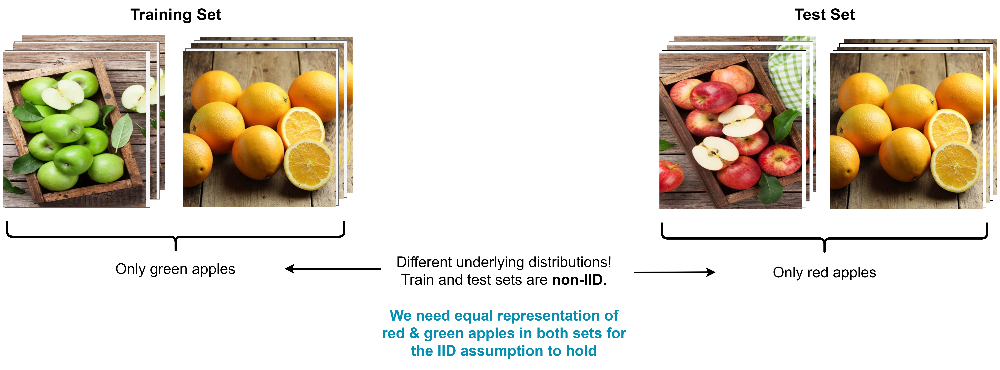

#### 2.2.2 Biais de labels non-IID

Dans les problèmes d'apprentissage supervisé, le *biais de labels* est une condition courante rendant les partitions des clients non-IID. Cela signifie que la représentation de classes spécifiques (c'est-à-dire les proportions de labels de classe) varie d'un client à l'autre. Illustrons d'abord cela en créant un ensemble de données synthétique avec 1 000 exemples d'entraînement appartenant chacun à 1 des 10 classes.

In [ ]:
from sklearn.datasets import make_blobs

N = 1000 # Exemples d'entraînement
d = 2 # Dimension de chaque point de données (c'est-à-dire nombre de caractéristiques)
num_classes = 10

# Créer un ensemble de données synthétique avec `num_classes` classes bien séparées
x, y = make_blobs(n_samples=N, n_features=d, centers=num_classes, random_state=42)

plt.figure(figsize=(5, 3))
for label in range(num_classes):
    plt.scatter(x[(y==label), 0], x[(y==label), 1])
plt.title(f'Ensemble de données synthétique à 10 classes (N={N})')
plt.xlabel('Caractéristique $x_0$'), plt.ylabel('Caractéristique $x_1$');


Notez que cet ensemble de données est équilibré, ce qui signifie que le nombre de points de données appartenant à chaque classe est constant, donné par

$N_j = \frac{N}{C} \,\,\,,\,\,\, j = \{0, 1, 2, ..., C-1\}$

où $N$ est le nombre total d'exemples d'entraînement, $N_j$ est le nombre d'exemples d'entraînement appartenant à la classe $j$ et $C$ est le nombre total de classes.

Maintenant, partitionnons (c'est-à-dire divisons) cet ensemble de données entre 5 clients. Notez que c'est une pratique courante dans la recherche sur le FL, car les problèmes de classification de référence tels que MNIST ou CIFAR10 sont des ensembles de données centralisés et doivent être partitionnés artificiellement afin de réaliser des expériences de FL.

Pour ceux qui sont intéressés, notre schéma de partitionnement utilise un algorithme appelé Latent Dirichlet Allocation (LDA) pour contrôler le degré de biais de labels en fonction d'un paramètre appelé `iid-alpha`. Cependant, vous n'avez pas besoin de comprendre en détail le fonctionnement de ce code. Veuillez exécuter la cellule et continuer.

In [ ]:
# TODO: Cacher cette cellule?

XY = tuple[np.ndarray, np.ndarray] # (X, Y)
XYList = list[XY]
PartitionedDataset = tuple[XYList, XYList]

np.random.seed(1337)

def sort_by_label(x: np.ndarray, y: np.ndarray) -> XY:
    """Trie les exemples d'entraînement x par leurs labels de classe y."""
    idx = np.argsort(y, axis=0).reshape(y.shape[0])
    return (x[idx], y[idx])

def shuffle(x: np.ndarray, y: np.ndarray) -> XY:
    """Mélange x et y."""
    idx = np.random.permutation(len(x))
    return x[idx], y[idx]

def split_array_at_indices(
    x: np.ndarray, split_idx: np.ndarray
) -> list[list[np.ndarray]]:
    """Divise un tableau `x` en une liste d'éléments en utilisant les indices de départ de
    `split_idx`.

    """

    num_splits: int = len(split_idx)
    split_idx = np.append(split_idx, x.shape[0])

    list_samples_split: list[list[np.ndarray]] = [[] for _ in range(num_splits)]
    for j in range(num_splits):
        tmp_x = x[split_idx[j] : split_idx[j + 1]]
        for sample in tmp_x:
            list_samples_split[j].append(sample)

    return list_samples_split

def exclude_classes_and_normalize(
    distribution: np.ndarray, exclude_dims: list[bool], eps: float = 1e-5
) -> np.ndarray:
    """Exclut les classes d'une distribution.

    Cette fonction est utile lors de l'échantillonnage sans remplacement.
    Les classes pour lesquelles aucun échantillon n'est disponible ont leurs probabilités définies à 0.
    Les classes dont les probabilités étaient initialement définies à 0 sont incrémentées avec
     `eps` pour permettre l'échantillonnage à partir des éléments restants.

    """
    if np.any(distribution < 0) or (not np.isclose(np.sum(distribution), 1.0)):
        raise ValueError("La distribution doit totaliser 1 et n'avoir que des valeurs positives.")

    if distribution.size != len(exclude_dims):
        raise ValueError(
            """La longueur de la distribution doit être égale
            à la longueur `exclude_dims`."""
        )
    if eps < 0:
        raise ValueError("""La valeur de `eps` doit être positive et petite.""")

    distribution[[not x for x in exclude_dims]] += eps
    distribution[exclude_dims] = 0.0
    sum_rows = np.sum(distribution) + np.finfo(float).eps
    distribution = distribution / sum_rows

    return distribution

def sample_without_replacement(
    distribution: np.ndarray,
    list_samples: list[list[np.ndarray]],
    num_samples: int,
    empty_classes: list[bool],
) -> tuple[XY, list[bool]]:

    """Échantillonne à partir d'une liste sans remplacement en utilisant une distribution donnée.

    """

    if np.sum([len(x) for x in list_samples]) < num_samples:
        raise ValueError(
            """Le nombre d'échantillons dans `list_samples` est inférieur à `num_samples`"""
        )

    # Assurez-vous que les classes vides ne sont pas échantillonnées
    # et résout les rares cas où
    if not empty_classes:
        empty_classes = len(distribution) * [False]

    distribution = exclude_classes_and_normalize(
        distribution=distribution, exclude_dims=empty_classes
    )

    data: list[np.ndarray] = []
    target: list[np.ndarray] = []

    for _ in range(num_samples):
        sample_class = np.where(np.random.multinomial(1, distribution) == 1)[0][0]
        sample: np.ndarray = list_samples[sample_class].pop()

        data.append(sample)
        target.append(sample_class)


        # Si le dernier échantillon de la classe a été tiré, alors définissez la
        #  fonction de densité de probabilité (PDF) à zéro pour cette classe.
        if len(list_samples[sample_class]) == 0:
            empty_classes[sample_class] = True
            # Veillez à faire la distinction entre les classes qui avaient une probabilité nulle
            # et les classes qui sont maintenant vides
            distribution = exclude_classes_and_normalize(
                distribution=distribution, exclude_dims=empty_classes
            )
    data_array: np.ndarray = np.concatenate([data], axis=0)
    target_array: np.ndarray = np.array(target, dtype=np.int64)

    return (data_array, target_array), empty_classes


def create_lda_partitions(
    dataset: XY,
    num_partitions: int = 10,
    concentration: float | np.ndarray | list[float] = 0.5,
    seed: int | None = None,
) -> tuple[XYList, np.ndarray]:
    """Crée des partitions non-iid déséquilibrées en utilisant l'allocation de Dirichlet latente
    (LDA) sans rééchantillonnage.

    """

    x, y = dataset
    x, y = shuffle(x, y)
    x, y = sort_by_label(x, y)

    # obtenir le nombre d'échantillons pour chaque classe
    num_samples = num_partitions * [0]
    for j in range(x.shape[0]):
        num_samples[j % num_partitions] += 1 # compter les échantillons appartenant à la classe j

    # Obtenir le nombre de classes et les indices de départ (y a déjà été trié)
    classes, start_indices = np.unique(y, return_index=True)

    # Assurez-vous que la concentration est un np.array et
    # vérifiez si la concentration est appropriée
    concentration = np.asarray(concentration)

    # initialiser l'objet partitions à retourner
    partitions: list[XY] = [(_, _) for _ in range(num_partitions)]

    concentration = np.repeat(concentration, classes.size)

    # Diviser en une liste de listes d'échantillons par classe
    list_samples_per_class: list[list[np.ndarray]] = split_array_at_indices(
        x, start_indices
    )

    dirichlet_dist = np.random.default_rng(seed).dirichlet(
        alpha=concentration, size=num_partitions
    )

    # En supposant une distribution équilibrée
    empty_classes = classes.size * [False]
    for partition_id in range(num_partitions):
        partitions[partition_id], empty_classes = sample_without_replacement(
            distribution=dirichlet_dist[partition_id].copy(),
            list_samples=list_samples_per_class,
            num_samples=num_samples[partition_id],
            empty_classes=empty_classes,
        )

    return partitions, dirichlet_dist

Finally, we are ready to see how the magic happens! Run the cell below, and play around with the IID Alpha parameter to see how this effects each of the local client distributions.

In [ ]:
num_clients = 3
iid_alphas = [0.1, 0.2, 0.5, 1.0, 10, 1000, 100000]

def plot_partitions(iid_factor=3):

    # partitionner l'ensemble de données centralisé en fonction de num_clients et iid_factor
    client_partitions, _ = create_lda_partitions(
        dataset=(x, y), num_partitions=num_clients,
        concentration=iid_alphas[iid_factor], seed=13
    )

    fig = plt.figure(figsize=(15, 8))
    fig.suptitle(f"Partitions des clients (iid-alpha={iid_alphas[iid_factor]})",
                 fontsize=17)

    gs = fig.add_gridspec(2, num_clients)
    axarr = [None]*num_clients # stocker les axes de tracé de chaque client dans une liste

    # graphique de représentation des classes
    ax_bottom = fig.add_subplot(gs[1, :]) # axes
    xticks = np.arange(num_classes)  # emplacements des labels pour le graphique du bas
    xlabels = [f"Classe {i}" for i in xticks] # labels des xticks pour le graphique du bas
    width = 0.12  # la largeur des barres
    multiplier = 0

    # créer des sous-graphiques "Client 1" à "Client `num_clients`"
    for c in range(num_clients):
        partition_x, partition_y = client_partitions[c]
        axarr[c]= fig.add_subplot(gs[0, c])

        # mettre à l'échelle les limites x et y pour des emplacements de cluster de classe cohérents
        axarr[c].set(title=f"Client {c+1}",
                     xlim=[min(x[:, 0])-0.5, max(x[:, 0])+0.5],
                     ylim=[min(x[:, 1])-0.5, max(x[:, 1])+0.5])

        # nuage de points de tous les clusters de classe pour le client actuel
        for label in range(num_classes):
            axarr[c].scatter(partition_x[(partition_y==label), 0],
                             partition_x[(partition_y==label), 1])

        # ajouter la distribution des classes du client actuel au graphique du bas
        hist_c, _ = np.histogram(client_partitions[c][1],
                                 bins=list(range(num_classes + 1)))
        offset = width * multiplier
        rects = ax_bottom.bar(xticks + offset, hist_c, width,
                              label=f"Client {c+1}")
        multiplier += 1

    ax_bottom.set_title('Représentation des classes')
    ax_bottom.set_ylabel('Nombre d\'échantillons')
    ax_bottom.set_xticks(xticks + width, xlabels)
    ax_bottom.legend(loc='upper left');

slider = interact(plot_partitions, iid_factor=(0, len(iid_alphas)-1))

**Questions:**

* Que se passe-t-il avec l'équilibre des classes entre les clients lorsque les partitions sont plus non-IID (c'est-à-dire lorsque le paramètre `iid-alpha` est plus petit) ?
<details>
<summary><font color='black'><b> Cliquez pour la réponse </b> </font> </summary>
    Les représentations des classes deviennent de plus en plus déséquilibrées et peuvent éventuellement ne contenir aucun échantillon de certaines classes.
</details>

* Dans le pire des cas, certaines partitions de clients contiennent **zéro** exemple de certaines classes. Si nous entraînions une copie du modèle global sur une telle partition, comment le modèle mis à jour fonctionnerait-il sur un ensemble de test réservé qui contient en fait ces classes ?
<details>
<summary><font color='black'><b> Cliquez pour la réponse </b> </font> </summary>
    Nous ne savons pas exactement ce qui se passerait. Il pourrait y avoir un certain transfert de connaissances de certaines des classes qui étaient incluses dans l'ensemble d'entraînement. Cependant, cela n'est pas garanti. Dans le pire des cas, si les échantillons non observés sont complètement distincts des échantillons d'entraînement, le modèle fonctionnerait de la même manière qu'un modèle initialisé de manière aléatoire.
</details>

* (Avancé/Optionnel) Avec des partitions non-IID, tout le déséquilibre de classe ne serait-il pas pris en compte lorsque nous agrégeons les mises à jour du modèle client ?
<details>
<summary><font color='black'><b> Cliquez pour la réponse </b> </font> </summary>
    Pas nécessairement. Pensons-y de cette façon : en considérant l'ensemble de données comme un tout, la mise à jour que le modèle prendra sera, en quelque sorte, une direction optimale pour toutes les classes. Cependant, des partitions de clients hautement hétérogènes peuvent entraîner des mises à jour de modèle spécifiques à cet ensemble de données local. De plus, les mises à jour du modèle de chaque client peuvent être dans une direction complètement opposée par rapport à un autre client lorsque l'on considère la mise à jour globale. Ainsi, lorsque vous faites la moyenne de deux vecteurs dans des directions opposées, vous obtenez un vecteur plus petit qui peut ne pas être aligné avec la direction d'optimisation globale. En tant que tel, le modèle global peut devenir très instable en cas de très forte hétérogénéité des clients. Si vous avez du mal à comprendre cela (comme nous l'avons fait au départ), veuillez demander à un tuteur de vous fournir une explication plus approfondie.
</details>

### 2.3 Hétérogénéité des appareils

Les appareils clients varient considérablement en termes de vitesse et de connectivité, ce qui pose un autre défi pour les algorithmes FL comme FedAvg. En particulier, les algorithmes FL synchrones attendent que tous les clients aient terminé leurs époques locales avant d'agréger et de commencer un nouveau round. Le problème ici, comme vous pouvez l'imaginer, est que les clients plus lents (appelés *stragglers*) peuvent être un goulot d'étranglement ralentissant l'entraînement FL global.


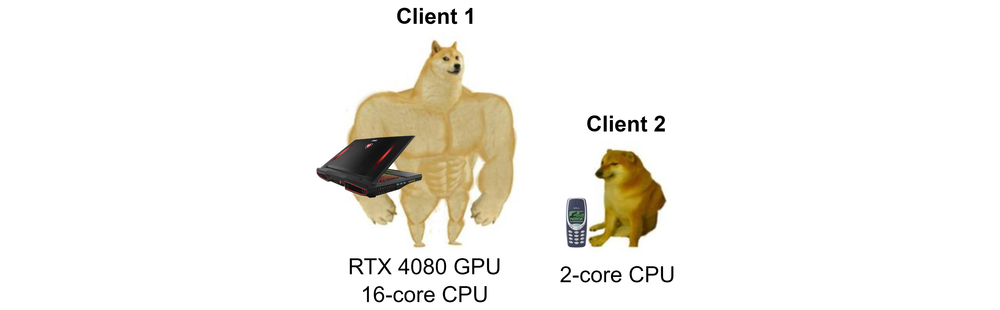

### 2.4 Résumé des concepts du FL

Bien joué ! À ce stade, vous avez été exposé à certains des concepts fondamentaux du FL et vous devriez comprendre la configuration générale et certains des défis qui y sont associés.

Il est maintenant temps de commencer à mettre en œuvre le FL vous-même ! Voici un résumé des concepts clés que nous avons abordés. N'hésitez pas à revenir en arrière si vous êtes bloqué plus tard !

* Stratégie d'agrégation
* Clients :
* Serveur de paramètres :
* Hétérogénéité des données
* IID vs Non-IID
* Hétérogénéité des appareils

---
## Section 3: Votre premier exemple de FL -- Régression non linéaire <a class="anchor" id="section-3"></a>
---

### 3.1 L'exemple d'aujourd'hui -- Régression non linéaire

Dans une tâche de régression standard, nous essayons d'ajuster un modèle aux données comme une combinaison non linéaire des caractéristiques du modèle présentes. Nous supposons que nous avons une fonction $f(x)$ qui produira une cartographie non linéaire de l'espace d'entrée $x$ à l'espace de sortie $\hat{y}$.

Dans une configuration standard (en continuant l'utilisation de la régression linéaire), vous créeriez une frontière de décision non linéaire grâce à l'utilisation de fonctions de base (voir la section 3.1 de Pattern Recognition and Machine Learning de Chris Bishop pour un traitement rigoureux de cette question). Cependant, dans notre cas, nous utiliserons un réseau de neurones avec des fonctions d'activation non linéaires pour apprendre la cartographie à la place. Beaucoup plus simple et moins de maths :D !

Nous utiliserons JAX aujourd'hui pour faire plusieurs choses :
(1) Générer nos exemples d'ensembles de données, très cool : cela tire parti de la façon dont JAX gère les nombres aléatoires (ajouter une référence).
(2) Les ensembles de données ont deux variantes : iid et non-iid. Nous développerons davantage sur ce point dans la section suivante !
(2) Nous définirons notre réseau de neurones simple en utilisant flax (https://flax.readthedocs.io/en/latest/) en utilisant l'API linen -- une abstraction très courante et puissante pour définir et travailler avec le deep learning dans JAX. Les optimiseurs proviennent cependant d'Optax, car c'est parfois comme ça.
(3) Nous utiliserons ensuite l'algorithme Federated Averaging (FedAvg) pour ajuster notre modèle aux données, cela impliquera quelques extensions à notre définition précédente, qui seront décrites plus en détail au fur et à mesure.

Dans l'exemple de régression d'aujourd'hui, nous allons générer des données de régression. Une régression typique peut consister en une seule ou plusieurs caractéristiques (qui peuvent être dépendantes ou indépendantes les unes des autres - nous découvrons souvent ces choses à la dure - en éprouvant du dédain après qu'un modèle ne fonctionne pas bien).

Le "nombre" total de points de données reste le même pour tous les clients, car nous ne voulons pas que notre exemple soit plus compliqué qu'il ne doit l'être. Mais il est bon de noter que dans des contextes réalistes, en plus du "biais de labels" (certaines classes ont plus de données que d'autres classes), il peut également y avoir un "biais de quantité" qui implique que certains clients ont simplement des ensembles de données très petits par rapport à d'autres.

### 3.2 Générer un exemple d'ensemble de données

Pour la première tâche, vous allez générer les données et également définir les paramètres de l'expérience. Veuillez d'abord lire un bref récapitulatif de ce que représente chaque variable et les définir selon votre choix.

- **n_features** - nombre de caractéristiques présentes dans notre fonction, afin de visualiser facilement nos données -- cela restera **fixé** à 2.
- **n_samples** - étant donné une fonction, combien d'échantillons voulez-vous présents dans votre ensemble de données (plus le nombre d'échantillons est faible, plus l'ajustement est rapide -- comment cela affectera-t-il l'ajustement de vos modèles ? Essayez de le découvrir)
- **learning_rate** - Le taux d'apprentissage pour le solveur de descente de gradient utilisé pour résoudre le problème, c'est ce que l'on appelle le « taux d'apprentissage local » dans les configurations de Federated Learning, et il est défini pour chaque client. Par souci de simplicité, chaque client aura le même taux d'apprentissage et nous n'aurons aucun taux d'apprentissage global.
- **local epochs** - Dans le Federated Learning, et FedAvg pour être précis -- nous effectuons un sgd local, chaque client exécute plusieurs étapes de descente de gradient localement avant de communiquer les paramètres au serveur. Cela nous permet de communiquer moins et en fait de converger plus rapidement ! Veuillez expérimenter avec différentes valeurs et voir comment cela affecte votre convergence.
- **global rounds** - Dans le Federated Learning, nous avons la notion de « rounds globaux » au cours desquels nous mettons à jour notre modèle global. Dans notre configuration, un round global est terminé une fois que les clients ont tous terminé leurs époques locales et communiquent leurs paramètres de modèle.

En règle générale, le Federated Learning fonctionne dans le cadre d'une « participation partielle » qui permet la robustesse à certains clients en cas de panne ou de retrait, etc., dans notre exemple simple, nous ignorerons cela.

Par tous les moyens, veuillez expérimenter avec différentes valeurs.



In [ ]:
## N'hésitez pas à générer des données de la taille que vous souhaitez
n_features: int = 2 ## garder fixe, ne pas modifier
n_samples: int = 100

# Configuration de l'entraînement :
learning_rate: float = 0.001 # taux d'apprentissage du client
local_epochs: int = 5 # par round, le nombre d'époques locales pour lesquelles chaque client s'entraîne
global_rounds: int = 4000 # nombre total de rounds d'entraînement fédéré

Le processus de génération de données dépend des variables que vous avez définies auparavant -- vous pouvez l'ignorer pour l'instant. N'hésitez pas à le consulter si vous souhaitez mieux le comprendre.

#### Données non IID

Nous supposons que nous avons une seule caractéristique $x \in U[-2, 2]$ mais trois fonctions client différentes $f_1, f_2, f_3$ qui généreront les observations pour chaque client séparément selon une fonction pré-spécifiée.
Nous avons un bruit gaussien ajouté avec une moyenne de 0 et différents écarts types.

1.  $ f_1(x) =  x^2 + 10 * \sin(x)  +  N(0, 2) $
2.  $ f_2(x) = e^x - 2x^{2} + N(0, 1.5)$
3.  $ f_3(x) = 3x^3 - 5cos(x) + N(0, 1)$

#### Données IID

1. $ f_1(x) = x^3 + N(0, 1.5) $
2. $ f_2(x) = x^3 + N(0, 1.5) $
3. $ f_3(x) = x^3 + N(0, 1.5) $

Les données IID ont la même variable avec des instances de bruit tirées de la même distribution qui les distinguent. Mais elles sont toujours IID.

In [ ]:
key, subkey = random.split(key)
x1_noniid = random.uniform(subkey, (n_samples, 1), minval=-2, maxval=2)
y1_noniid = (x1_noniid ** 2 + 10 * jnp.sin(x1_noniid) + random.normal(subkey, (n_samples, 1)) * 2)

key, subkey = random.split(key)
x2_noniid = random.uniform(subkey, (n_samples, 1), minval=-2, maxval=2)
y2_noniid = (jnp.exp(x2_noniid) - 2 * x2_noniid ** 2 + random.normal(subkey, (n_samples, 1)) * 1.5)

key, subkey = random.split(key)
x3_noniid = random.uniform(subkey, (n_samples, 1), minval=-2, maxval=2)
y3_noniid = (3 * x3_noniid ** 3 - 5 * jnp.cos(x3_noniid) + random.normal(subkey, (n_samples, 1)))

key, subkey = random.split(key)
x_iid = random.normal(subkey, (n_samples, 1))
y_iid1 = (x_iid ** 3 + random.normal(subkey, (n_samples, 1)) * 1.5)

key, subkey = random.split(key)
y_iid2 = (x_iid ** 3 + random.normal(subkey, (n_samples, 1)) * 1.5)

key, subkey = random.split(key)
y_iid3 = (x_iid ** 3 + random.normal(subkey, (n_samples, 1)) * 1.5)

non_iid_datasets = [ # ensembles de données non-iid
    {'x': x1_noniid, 'y': y1_noniid},
    {'x': x2_noniid, 'y': y2_noniid},
    {'x': x3_noniid, 'y': y3_noniid},
]

iid_datasets = [ # ensembles de données iid
    {'x': x_iid, 'y': y_iid1},
    {'x': x_iid, 'y': y_iid2},
    {'x': x_iid, 'y': y_iid3},
]

### 3.3 Définir un réseau de neurones simple pour la régression

Le réseau de neurones devrait être capable de prendre en entrée votre ensemble de données et de fournir un seul scalaire comme prédiction/sortie.

Par conséquent, il ne devrait y avoir aucune fonction d'activation sur la sortie -- vous pouvez définir un réseau de taille arbitraire, bien qu'étant donné la faible complexité de notre tâche, vous pourriez vous en sortir avec quelque chose avec une seule couche.

Vous n'avez pas besoin de prendre en compte la taille du lot (batch_size) -- car nous ferons un lot entier en une seule étape [donc gardez votre n_samples raisonnable :D].

In [ ]:
## options for layers and syntax include
## nn.Dense(features=size)(x) where size can be (128, 200, 256 etc.,) nn.relu(x) etc. --> you can add as many layers as you'd like.
class SimpleNN(nn.Module):
    @nn.compact
    def __call__(self, x):
        ## TODO VOTRE CODE ICI ###
        # x = ## your code here
        # x = nn.Dense(features=1)(x)
        ### FIN TODO ###
        return x

<details>
<summary><font color='black'><b> Cliquez pour un exemple d'implémentation de code </b> </font> </summary>
Voici un exemple avec trois couches.
<code>
class SimpleNN(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=128)(x)
        x = nn.relu(x)
        x = nn.Dense(features=64)(x)
        x = nn.relu(x)
        x = nn.Dense(features=1)(x)
        return x
</code>
</details>

### 3.4 Les fonctions d'entraînement et la boucle

Dans l'intérêt du temps et d'autres composants, nous supposerons que vous avez une fonction qui effectuera l'entraînement pour vous, c'est-à-dire qu'elle
- Effectuera un passage en avant (forward pass) sur chaque client par rapport à son ensemble de données
- Calculera la perte
- Effectuera la rétropropagation (backpropagation) et mettra à jour le modèle local pour `local_epochs`
- Diffusera les paramètres de chaque client
- Les agrégera pour mettre à jour le modèle global.

Ce code est utilisé pour générer la boucle d'entraînement. N'hésitez pas à le parcourir - il n'est pas essentiel pour transmettre une quelconque compréhension.


In [ ]:
def create_train_state(rng, lr):
    """
    Fonction pour initialiser les paramètres du modèle et l'optimiseur. Ici, nous allons définir le réseau de neurones simple et utiliser SGD
    """
    model = SimpleNN()
    params = model.init(rng, jnp.ones((1, 1)))['params'] ### initialise le réseau avec rng, flax a besoin de la forme d'entrée pour le faire.
    tx = optax.sgd(lr, momentum=0.9)
    return train_state.TrainState.create(apply_fn=model.apply, params=params, tx=tx) ## ce 'wrapper' simplifie la façon dont nous mettons à jour notre état pendant l'entraînement.


def mse_loss(params, apply_fn, x, y):
    """Fonction de perte d'erreur quadratique moyenne (Mean Squared Error Loss function)

    Args:
        params: paramètres du modèle à appliquer à l'entrée
        apply_fn: méthode pour appliquer le modèle à l'entrée
        x: entrée
        y: vérité terrain (ground truth)
    Returns:
        Perte MSE entre les prédictions et la vérité terrain
    """
    preds = apply_fn({'params': params}, x) ### calculer les prédictions
    return jnp.mean((preds - y) ** 2) ## calculer la perte

@jax.jit
def train_step(state, x, y):
    """Définition de l'étape d'entraînement (ou ce qui se passe à chaque étape d'entraînement)
    Nous calculons un passage en avant, calculons la perte, puis calculons par la suite la perte, le passage en arrière (backward pass) et enfin mettons à jour le modèle.
    Rappelez-vous que dans notre contexte, il s'agit d'une « époque locale »

    Args:
        state : état du modèle (contient la fonction apply_fn et la référence aux paramètres)
        x : données d'entrée
        y : vérité terrain
    """
    def loss_fn(params):
        loss = mse_loss(params, state.apply_fn, x, y)
        return loss
    loss, grads = jax.value_and_grad(loss_fn)(state.params)
    state = state.apply_gradients(grads=grads)
    return state, loss


def train_model(state, x, y, num_epochs=1):
    """Boucle d'entraînement

    Args:
        state: état du modèle (contient la fonction apply_fn et la référence aux paramètres)
        x: données d'entrée
        y: vérité terrain
        num_epochs (int): nombre d'époques pour l'entraînement
    Returns:
        état final du modèle après l'entraînement pour num_epochs
    """
    for epoch in range(num_epochs):
        state, loss = train_step(state, x, y) ## calculer la perte et le nouvel état
    return state

@jax.jit
def federated_averaging(params_list):
    """Implémentation de l'agrégation du Federated Learning au sens de la somme finie.

    Args:
        params_list (_type_): liste contenant les paramètres de nos modèles clients.

    Returns:
        paramètres moyennés.
    """
    return jax.tree_util.tree_map(lambda *x: jnp.mean(jnp.stack(x), axis=0), *params_list) ## nous empilons d'abord tous les paramètres, puis calculons la moyenne par valeur de paramètre

@jax.jit
def evaluate_global_model(state, datasets):
    """Fonction d'évaluation pour vérifier les performances du modèle global

    Args:
        state (_type_): état de notre modèle
        datasets (_type_): ensemble de données sur lequel nous voulons évaluer

    Returns:
        précision
    """
    total_loss = 0.0
    count = 0
    for data in datasets:
        x, y = data['x'], data['y']
        loss = mse_loss(state.params, state.apply_fn, x, y)
        total_loss += loss * x.shape[0]
        count += x.shape[0]
    return total_loss / count

def federated_training(datasets, global_rounds, local_epochs, initial_lr, rng):
    """Super-fonction d'entraînement fédéré

    Args:
        datasets (dict[str : jnp.array]): ensemble de données sur lequel nous voulons nous entraîner
        global_rounds (int): nombre total de rounds globaux
        local_epochs (int): nombre d'époques locales pour chaque client
        initial_lr (float): taux d'apprentissage de chaque client
        rng (jnp.key): clé pour amorcer l'exécution de l'entraînement

    Returns:
        paramètres finaux et la perte globale
    """
    state = create_train_state(rng, initial_lr)
    global_losses = []

    for _ in tqdm.tqdm(range(global_rounds)):
        states = []
        for data in datasets:
            x, y = data['x'], data['y']
            local_state = train_model(state, x, y, num_epochs=local_epochs) ### exécuter SGD local pour un client donné
            states.append(local_state.params) ## collecter l'état du client après SGD local

        state = state.replace(params=federated_averaging(states)) ### remplacer l'état actuel par le nouvel état moyenné

        global_loss = evaluate_global_model(state, datasets) ## évaluer le modèle global afin que nous puissions avoir une idée des progrès
        global_losses.append(global_loss)

    return state.params, global_losses

Ci-dessous, nous effectuerons deux sessions d'entraînement : une pour l'ensemble de données non_iid et une autre pour l'ensemble de données iid.


In [ ]:
print("Entraînement avec des données non_iid.")
fed_avg_params_noniid, noniid_losses = federated_training(datasets=non_iid_datasets, global_rounds=global_rounds, local_epochs=local_epochs, initial_lr=learning_rate, rng=key)

print("Entraînement avec des données iid.")
fed_avg_params_iid, iid_losses = federated_training(iid_datasets, global_rounds, local_epochs, learning_rate, key)

Maintenant, nous allons visualiser la fonction que chaque modèle a apprise.


In [ ]:
model = SimpleNN()
x_test = jnp.linspace(-3, 3, 100).reshape(-1, 1)
preds_noniid = model.apply({'params': fed_avg_params_noniid}, x_test) # prédictions non-iid
preds_iid = model.apply({'params': fed_avg_params_iid}, x_test) # prédictions iid

def plot_regression_lines(x_test, preds_noniid, preds_iid, non_iid_datasets, iid_datasets):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(x_test, preds_noniid, color='blue', label='Modèle fédéré Non-IID')
    for data in non_iid_datasets:
        x, y = data['x'], data['y']
        axs[0].scatter(x, y, alpha=0.6)
    axs[0].set_title('Régression Non-IID')
    axs[0].set_xlabel('x')
    axs[0].set_ylabel('y')
    axs[0].legend()

    axs[1].plot(x_test, preds_iid, color='green', label='Modèle fédéré IID')
    for data in iid_datasets:
        x, y = data['x'], data['y']
        axs[1].scatter(x, y, alpha=0.6)
    axs[1].set_title('Régression IID')
    axs[1].set_xlabel('x')
    axs[1].set_ylabel('y')
    axs[1].legend()

    plt.tight_layout()
    plt.show()

plot_regression_lines(x_test, preds_noniid, preds_iid, non_iid_datasets, iid_datasets)

def plot_losses(noniid_losses, iid_losses): # (pertes non-iid, pertes iid)
    plt.plot(noniid_losses, label='Perte Non-IID', color='blue')
    plt.plot(iid_losses, label='Perte IID', color='green')
    plt.xlabel('Rounds globaux')
    plt.ylabel('Perte du modèle global')
    plt.legend()
    plt.show()

plot_losses(noniid_losses, iid_losses)

Sur la base de votre expérimentation avec ce qui précède, répondez aux questions suivantes :

1. Quelle tâche de régression était la plus difficile : iid ou non-iid ? Comment êtes-vous arrivé à cette conclusion ?
Réponse :

2. Visuellement, quelles sont les différences que vous avez remarquées avec les tâches iid et non-iid ?
Réponse :

3. Avez-vous remarqué que le modèle entraîné sur l'un ou l'autre a complètement convergé ?
Réponse :

4. Qu'est-ce qui, le cas échéant, pourrait aider à améliorer les performances dans le cas de la tâche la plus difficile ?
Réponse :

5. Qu'avez-vous d'autre remarqué à propos des données ?
Réponse :

<details>
    <summary>Cliquez ici pour découvrir quelques réponses !</summary>
Sur la base de votre expérimentation avec ce qui précède, répondez aux questions suivantes :

1. Quelle tâche de régression était la plus difficile : iid ou non-iid ? Comment êtes-vous arrivé à cette conclusion ?
Réponse : Clairement, les ensembles de données non-iid étaient beaucoup plus difficiles que le contexte iid. En effet, l'ajustement de la régression est bien pire et la perte s'est saturée à une valeur beaucoup plus élevée que dans le contexte iid.
2. Visuellement, quelles sont les différences que vous avez remarquées avec les tâches iid et non-iid ?
Réponse : L'ajustement pour les modèles entraînés sur les données iid était beaucoup plus uniforme et plus proche en raison de la moindre variation des données. Alors qu'il y avait quelques caractéristiques marquées dans la solution pour les données non-iid qui pouvaient entraîner certaines difficultés sur les ensembles de données de certains clients.
3. Avez-vous remarqué que le modèle entraîné sur l'un ou l'autre a complètement convergé ?
Réponse : Non, les deux ensembles de données avaient une perte non nulle -- et ils n'avaient pas complètement convergé même si visuellement il peut sembler que l'entraînement iid a un très bon ajustement.
4. Qu'est-ce qui, le cas échéant, pourrait aider à améliorer les performances dans le cas de la tâche la plus difficile ?
Réponse : Plus d'époques locales, un meilleur optimiseur, plus de rounds globaux.
5. Qu'avez-vous d'autre remarqué à propos des données ?
Réponse : Réponse ouverte
</details>

---
## Section 4: Comparaison de l'entraînement centralisé et décentralisé - <font color='blue'>`Débutant`</font>
---

À présent, nous avons (espérons-le) réussi à transmettre l'essence de ce qu'est le Federated Learning. Au lieu d'effectuer un entraînement centralisé où nous avons besoin que les données soient partagées, nous choisissons d'apprendre *en collaboration* en ne partageant que les informations que le modèle a apprises à travers ses poids et ses gradients.

Il est maintenant temps pour nous de nous plonger dans un exemple concret de la façon dont cela se traduit dans un problème de classification :D. Pour ce faire, nous allons entraîner deux modèles : l'un avec un paradigme d'entraînement centralisé et l'autre avec un paradigme d'entraînement distribué. Après cela, nous comparerons les recettes d'entraînement et ce que les modèles eux-mêmes ont appris.

Commençons par le modèle centralisé en premier.

### 4.1 Entraînement centralisé en Machine Learning

Commençons par entraîner le modèle de manière centralisée en utilisant le framework Jax. Nous avons intentionnellement essayé d'utiliser une structure similaire à la formation pratique sur les réseaux de neurones pour des raisons de cohérence. Si vous avez des difficultés avec cette section, veuillez consulter cette formation pratique pour vous rafraîchir la mémoire [ici](https://github.com/deep-learning-indaba/indaba-pracs-2024).


#### 4.1.1 Examinons d'abord les données

Pour les besoins de cette formation pratique, nous utiliserons l'ensemble de données Fashion-MNIST.
> Fashion-MNIST est un ensemble de données d'images d'articles de Zalando, composé d'un ensemble
 d'entraînement de 60 000 exemples et d'un ensemble de test de 10 000 exemples. Chaque exemple est une image en niveaux de gris de 28x28 pixels, associée à une étiquette parmi 10 classes. (https://github.com/zalandoresearch/fashion-mnist)

Naturellement, certains d'entre vous se demanderont peut-être : pourquoi voulons-nous utiliser un ensemble de données aussi simple ? La raison en est que notre intention n'est pas de battre les performances de pointe ou de montrer des fonctionnalités super extravagantes. Nous voulons simplement vous montrer un exemple qui vous permettra de vous lancer dans le développement d'un pipeline d'entraînement de machine learning. En tant que tel, nous avons naturellement réduit la complexité à la fois des données et du modèle que nous devons entraîner pour nous concentrer davantage sur l'expérience d'apprentissage.

Sans plus tarder, voyons ce que cet ensemble de données nous donne.

In [ ]:
fmnist_data = load_dataset("zalando-datasets/fashion_mnist", cache_dir="./data")
fmnist_data.set_format(type="numpy")

training_data, test_data = fmnist_data["train"], fmnist_data["test"]
print("Training Data Dimensions", training_data["image"].shape)
print("Test Data Dimensions", test_data["image"].shape)
# Visualisons quelques-unes des données d'entraînement :
class_examples = []
data_collection = list(zip(range(len(training_data["label"])), training_data["label"]))
for target in [0,1,2,3,4,5,6,7,8,9]:
    for index, im_tar in data_collection:
        if im_tar == target:
            class_examples.append((index, im_tar))
            break
    labels_mapping = ['t_shirt_top', 'trouser', 'pullover', 'dress', 'coat', 'sandal', 'shirt', 'sneaker', 'bag', 'ankle_boots']

fig, axes = plt.subplots (2,5, figsize=(8,4))
for idx, ax in enumerate(axes.flatten()):
    ax.imshow(training_data["image"][class_examples[idx][0]], cmap="gray")
    ax.set_title(labels_mapping[idx])
    ax.grid(False)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xlabel(f"Class idx: {idx}")
fig.show()

Ici, nous pouvons voir les exemples de classes eux-mêmes. Comme nous l'avons vu dans la description de l'ensemble de données ci-dessus, nous avons dix catégories d'articles différentes et chaque image est un point de données en niveaux de gris de 28x28.

Maintenant, pour la tâche de machine learning : nous allons entraîner un réseau de neurones à prédire le type d'article vestimentaire étant donné une image en entrée. Mathématiquement parlant, nous allons alimenter le réseau de neurones avec une image (exprimée sous forme de vecteur) $\mathbf{x}$ que nous supposons être à $d$ dimensions, et nous allons entraîner le réseau à prédire le numéro de classe (sous forme d'entier) $\hat{y}$ parmi un total de $C$ classes possibles (dans notre cas, c'est 10). Nous supposons que nous avons $N$ images $\mathcal{d} = \{(\mathbf{x}_n, y_n)\}_{n=1}^N$ et un réseau de neurones paramétré par $f_{\theta}(\mathbf{x}): \mathbb{R}^{d} \to \mathbb{R}^C$, où $f_{\theta}(\mathbf{x})=\mathbf{z}$. Pour rendre cela encore plus spécifique, notre réseau de neurones ne prédira pas un seul nombre $\hat{y}$. Au lieu de cela, il prédira un vecteur de nombres à $C$ dimensions $\hat{\mathbf{y}}$, où chaque dimension correspond à la "probabilité" que l'image appartienne à cette classe spécifique. Cette mesure de "probabilité" n'est pas une probabilité en fait, mais elle est plutôt connue sous le nom de logits - des probabilités logarithmiques non normalisées. Afin de les transformer en probabilités, nous allons passer le vecteur de sortie $\mathbf{z}$ à la fonction Softmax qui exponentiera et normalisera les logits, créant des probabilités $\hat{\mathbf{y}}_c = \frac{e^{z_c}}{\sum_{k=1}^C e^{z_k}}$. Maintenant, nous pouvons interpréter chaque dimension $c$ du vecteur comme la probabilité que l'image appartienne à la classe $c$.

Enfin, comme il s'agit d'un problème de classification multi-classes (plus d'une classe à prédire), nous utiliserons la perte d'entropie croisée comme fonction de perte.
$$
L = -\frac{1}{N}\sum_{n=1}^N \sum_{c=1}^{C} y_n^c \log \hat{y^{ c}_n}
$$
où $y_n^c$ est un label one-hot indiquant si l'image $n$ appartient à la classe $c$, et $\hat{y}_n^c$ est la prédiction du réseau de neurones de la probabilité que cela se produise. Comme dans le tutoriel sur les réseaux de neurones, nous voulons que le réseau de neurones minimise cette perte (plus elle est faible, mieux c'est), ce que nous réaliserons grâce à des méthodes de descente de gradient stochastique.

Afin de créer la version one-hot du label de données, nous créons un vecteur unique pour chaque point de données où il y a un seul 1 dans la dimension de la classe que cette image représente, et zéro partout ailleurs.

#### 4.1.2 Préparation des données

Suite à l'introduction mathématique, nous allons commencer à coder un perceptron multicouche (MLP). Avant de faire cela, nous devons nous assurer que nos données sont prêtes à être utilisées par le modèle.

Nous faisons ce qui suit :
1) Créez deux objets training_data et test_data. Nous voulons représenter l'image entière comme un seul vecteur à 784 (28*28) dimensions afin de pouvoir l'alimenter dans le MLP.

2) Avant de créer l'ensemble de données, nous devons normaliser les données.

Question : pourquoi devons-nous représenter l'image comme un seul vecteur ? Est-ce le cas pour toutes les architectures de réseaux de neurones ? Donnez un exemple si c'est le cas.
<details>
    <summary>Cliquez ici pour découvrir quelques réponses !</summary>
Les MLP, comme nous les avons utilisés dans cet exemple, ne peuvent pas gérer les entrées qui ont une profondeur (l'entrée doit être un seul vecteur contigu). Les réseaux de neurones convolutifs, en revanche, peuvent gérer les entrées qui ont une profondeur (vous pouvez alimenter directement une image dans le modèle). Il a été démontré que ces derniers fonctionnent mieux que les MLP car ils sont meilleurs pour extraire des caractéristiques utiles.
</details>

Question : pourquoi avons-nous besoin de normaliser les données d'entraînement ?
<details>
    <summary>Cliquez ici pour découvrir quelques réponses !</summary>
En normalisant les données, nous nous assurons que les données entrées dans le réseau de neurones sont dans une plage raisonnable (c'est-à-dire une moyenne nulle et une variance unitaire). Cela garantit la stabilité numérique et garantit que les caractéristiques ont la même échelle relative.
</details>

In [ ]:
def load_dataset(fmnist_data):
  # Extraire les données et les étiquettes (labels)
  training_data, test_data = fmnist_data["train"], fmnist_data["test"]

  # Ces images sont composées de valeurs entières de 0 à 255.0
  # Nous mettons les images à l'échelle entre un minimum et un maximum de 1
  x_max = 255.0
  x_min = 0.0
  num_labels = 10
  h, w = (28,28)
  num_pixels = h * w

  train_images, train_labels = training_data['image'], training_data['label']
  train_images = jnp.reshape(train_images, (len(train_images), num_pixels))
  train_images = (train_images - x_min)/(x_max - x_min)
  train_images = train_images.astype(jnp.float32)
  train_labels = train_labels.astype(jnp.float32)

  test_images, test_labels = test_data['image'], test_data['label']
  test_images = jnp.reshape(test_images, (len(test_images), num_pixels))
  test_images = (test_images - x_min)/(x_max - x_min)
  test_images = test_images.astype(jnp.float32)
  test_labels = test_labels.astype(jnp.float32)

  train_dataset = (train_images, train_labels)
  test_dataset = (test_images, test_labels)

  return train_dataset, test_dataset

#### 4.1.3 Création de la fonction de perte

Comme mentionné ci-dessus, afin d'entraîner notre réseau de neurones, nous avons besoin d'une sorte de moyen de quantifier "à quel point le modèle se comporte bien" dans la tâche de prédiction d'images. Nous allons maintenant procéder à la mise en œuvre à la fois d'une fonction Softmax, puis de la perte d'entropie croisée qui sera utilisée pour l'entraînement de notre réseau.

In [ ]:
def softmax(logits):
  exp_logits = jnp.exp(logits)
  return exp_logits / jnp.sum(exp_logits, axis=-1, keepdims=True)

def cross_entropy_softmax_loss(params, X, targets): # (paramètres, X, cibles)
    """Calcule la fonction de perte softmax d'entropie croisée

      Args:
        params: paramètres du modèle
        X: (nombre_de_caractéristiques, nombre_de_classes)
        targets: (nombre_d'échantillons)
    """

    preds = model.apply(params, X)

    # Calcule les probabilités softmax
    probs = softmax(preds)

    num_classes = preds.shape[-1]

    # Encodage one-hot des cibles
    targets_one_hot = jax.nn.one_hot(targets, num_classes)

    # Calcule la perte d'entropie croisée
    eps = 1e-15
    probs += eps # pour éviter d'appeler log avec des valeurs 0

    loss_i = jnp.sum(-targets_one_hot*jnp.log(probs), axis=-1)

    return jnp.mean(loss_i)


def model_predict(params, X):
    """Utilise le modèle pour la prédiction

      args:
        params: paramètres du modèle
        X: tableau de caractéristiques (nombre_d'échantillons, nombre_de_caractéristiques)

      return
        pred: classe prédite (nombre_d'échantillons, 1)
    """

    # appelle le modèle pour calculer les logits
    logits = model.apply(params, X)
    preds = jnp.argmax(logits, axis=-1)

    return preds

def accuracy_and_per_class_accuracy(params, X, targets): # (paramètres, X, cibles)
  """
  Calcule la précision et la précision par classe pour un modèle donné et un ensemble de données donné.

  Args:
    params: Paramètres du modèle.
    X: (nombre_de_caractéristiques, nombre_de_classes)
    targets: (nombre_d'échantillons)
  """
  predictions = model_predict(params, X).squeeze()
  num_classes = int(np.max(targets)) + 1
  per_class_accs = {idx: [] for idx in range(num_classes)} # précisions par classe
  for y_pred, y_true in zip(predictions, targets): # (y_prédit, y_vrai)
    per_class_accs[int(y_true)].append(1 if y_pred == y_true else 0)
  for class_num, results in per_class_accs.items():
    per_class_accs[class_num] = sum(results)/len(results)
  acc = sum(predictions==targets)/len(targets)
  return acc, per_class_accs

#### 4.1.4 Fonctions utilitaires pour le script d'entraînement

Youpi! Nous avons maintenant formaté les données comme nous le voulions. Parlons maintenant du réseau de neurones lui-même. Pour les besoins de cette tâche, nous allons utiliser un perceptron multicouche (MLP). Bien sûr, nous pourrions utiliser un réseau de neurones convolutif qui serait probablement plus performant. Mais comme précédemment, nous ne sommes pas trop intéressés par la complexité du modèle dans ce cas, mais plutôt par la comparaison des paradigmes d'entraînement.

Tout d'abord, nous devons créer un script qui effectue la descente de gradient.

In [ ]:
# Réadaptons notre fonction de descente de gradient par lot
def batch_gradient_descent(loss_fn, params, training_data, val_data, learning_rate=0.01, num_epochs=20, batch_size=10):
  """Implémentation basique de la descente de gradient par lot avec jax.

  Args:
    loss_fn
      la fonction de perte pour notre modèle.
    params:
      les paramètres initiaux du modèle.
    training_data # données d'entraînement
      un tuple avec les caractéristiques et les cibles pour l'entraînement.
    val_data # données de validation
      un tuple avec les caractéristiques et les cibles pour la validation.
    learning_rate
      taux d'apprentissage
    num_epochs
      nombre d'époques
    batch_size:
      taille de chaque mini-lot
  """

  X_train, y_train = training_data # (X_entraînement, y_entraînement)
  X_val, y_val = val_data # (X_validation, y_validation)

  num_samples, num_features = X_train.shape # (nombre d'échantillons, nombre de caractéristiques)

  # Créer une liste vide pour stocker la perte d'entraînement et de validation.
  loss_train = [] # perte d'entraînement
  loss_val  = [] # perte de validation
  val_accs = [] # précisions de validation
  num_classes = int(np.max(y_train))+1

  # Définir une fonction qui calcule la perte et les gradients
  loss_and_grad = jax.value_and_grad(loss_fn)

  for epoch in range(num_epochs):
    # Mélanger les données avant chaque époque
    shuffled_indices = np.arange(num_samples)
    np.random.shuffle(shuffled_indices)

    loss_train_epoch = []

    for start_idx in range(0, num_samples, batch_size):
      end_idx = start_idx + batch_size
      if end_idx > num_samples:
        end_idx = num_samples

      batch_indices = shuffled_indices[start_idx:end_idx]
      X_batch = X_train[batch_indices]
      y_batch = y_train[batch_indices]
      # Calculer la perte et les gradients en utilisant value_and_grad
      loss, grads = loss_and_grad(params, X_batch, y_batch)
      loss_train_epoch.append(loss)

      # Mettre à jour les paramètres
      params = jax.tree.map(lambda p, g: p -learning_rate*g, params, grads)

    # Nous devons transformer la liste en un tableau avant d'appliquer jnp.mean
    mean_loss = jnp.mean(jnp.array(loss_train_epoch))
    loss_train.append(mean_loss)

    # Calculer la perte de validation à la fin de l'époque
    loss_v = loss_fn(params, X_val, y_val)
    loss_val.append(loss_v)
    val_acc, val_per_class_acc = accuracy_and_per_class_accuracy(params,
                                                                 X_val, y_val) # (précision de validation, précision par classe de validation)
    val_accs.append(val_acc)

  # Tracer la perte d'entraînement et de validation
  epochs = range(1, num_epochs+1)
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))
  ax1.plot(epochs, loss_train, label='Perte d\'entraînement')
  ax1.plot(epochs, loss_val, label='Perte de validation')
  ax2.plot(epochs, val_accs, label="Précisions de validation")
  ax1.set_xlabel('Époque')
  ax1.set_ylabel('Perte')
  ax2.set_xlabel('Époque')
  ax2.set_ylabel('Précision')
  fig.suptitle('Résultats de l\'entraînement')
  ax1.legend()
  ax2.legend()

  # Afficher le graphique
  fig.show()

  return params

training_data, val_data = load_dataset(fmnist_data) # (données d'entraînement, données de validation)

#### 4.1.5 Création du réseau de neurones

Nous sommes presque prêts à entraîner notre réseau ! Nous avons juste besoin du réseau lui-même. Dans le bloc de code suivant, nous implémentons une classe qui définit un MLP à trois couches où nous utilisons des non-linéarités ReLU après l'entrée et la couche cachée.

In [ ]:
class Network(nn.Module):
  hidden_size: int
  output_size: int

  @nn.compact
  def __call__(self, x):
    # Première couche avec activation ReLU
    x = nn.Dense(self.hidden_size)(x)
    x = jax.nn.relu(x)

    # Deuxième couche
    x = nn.Dense(self.hidden_size)(x)
    x = jax.nn.relu(x)

    # Troisième couche (de sortie) sans activation appliquée - ce sont les logits.
    x = nn.Dense(self.output_size)(x)

    return x

#### 4.1.6 Entraînons-nous

À condition que nous ayons tout implémenté correctement, nous sommes maintenant prêts à entraîner notre réseau centralisé !

Que remarquez-vous à propos de la perte/précision ?

Idées d'extension :

1) Que se passe-t-il si vous vous entraînez plus longtemps ? Le modèle a-t-il convergé ?

2) Que se passe-t-il si vous augmentez la largeur du réseau de neurones ?

3) Que se passe-t-il si vous augmentez la profondeur du réseau de neurones ?

In [ ]:
# transformer et initialiser le modèle
seed = 67
input_size = 784
hidden_size = 100
output_size = 10
# Instancier le modèle
model = Network(hidden_size, output_size)

key = jax.random.PRNGKey(seed)
dummy = jnp.zeros((1, input_size), dtype=float)
initial_params = model.init(key, dummy)
params = batch_gradient_descent(cross_entropy_softmax_loss, initial_params, training_data, val_data, learning_rate=0.01, num_epochs=10, batch_size=1000)

<details>
    <summary>Cliquez ici pour voir les réponses à vos questions !</summary>
À partir des questions ci-dessus, il y a quelques observations intéressantes à noter :

1) Concernant la capacité du modèle : généralement, augmenter la largeur et la profondeur du réseau de neurones peut vous aider à mieux vous adapter aux _données d'entraînement_. Vous pouvez essentiellement y penser de cette façon : si vous mettez le modèle à l'échelle à une taille infinie, notre architecture de réseau de neurones devient essentiellement une table de consultation où nous sommes capables de prédire parfaitement chaque point de données. Cependant, cela se fait au prix de la capacité de généralisation - il est très probable que nous ayons appris les particularités des données d'entraînement et que nous n'ayons pas réellement appris à modéliser le problème très bien. C'est ce que l'on appelle généralement le surapprentissage (overfitting). Trouver le juste équilibre entre la capacité maximale du modèle à offrir les meilleures performances sans provoquer de surapprentissage est un peu un art, plutôt qu'une science exacte.
</details>

### 4.2 Entraînement décentralisé en Machine Learning - Federated Learning avec Flower !

__Nous utilisons la ressource suivante comme inspiration : https://flower.ai/docs/framework/tutorial-series-get-started-with-flower-pytorch.html. Merci à nos amis de Flower d'avoir réalisé un tutoriel aussi cool ! Notre intention ici est de fournir une explication de ce qui se passe sous le capot !__

Comme nous l'avons vu dans la première partie de ce tutoriel, nous savons qu'aborder le Federated Learning est *relativement* une extension simple de l'entraînement centralisé normal, à condition que vous ayez une intuition logique de ce qui se passe en coulisses. Nous espérons que nous avons construit cette intuition. Cependant, la difficulté réside en fait dans l'ingénierie : comment faire du Federated Learning à grande échelle, avec de nombreux ensembles de données, modèles et stratégies d'agrégation changeants ? Imaginez devoir répéter la première section de ce tutoriel encore et encore et encore... Pas amusant.

C'est là qu'interviennent les charmantes personnes de Flower. Ils ont créé un guichet unique pour tout Federated Learning utilisant Python. Leur framework fait une grande partie du travail d'ingénierie pour vous, afin que vous puissiez vous concentrer sur ce que vous voulez vraiment faire : le machine learning !

Maintenant, notre dernière tâche pour ce tutoriel est de produire un modèle en utilisant le framework de Flower. Nous vous guiderons à travers chaque partie du code, étape par étape, afin que vous puissiez voir comment les équations mathématiques que nous avons présentées sont liées au code sous-jacent. Ensuite, c'est à vous d'explorer *de manière créative* ! Le monde est votre huître pour l'essayer sur vos propres projets et commencer à poser les questions vraiment intéressantes :D

**REMARQUE** : Vous remarquerez peut-être qu'une partie du code a été écrite en PyTorch plutôt qu'en JAX. C'est parce que, du point de vue du développement, il était plus facile pour nous de réaliser cet exemple en utilisant PyTorch. Cependant, nous ne vous demanderons pas d'interagir directement avec PyTorch et nous préciserons où nous avons établi des équivalences entre le code JAX et PyTorch.

#### Importations diverses

In [ ]:
from flwr_datasets import FederatedDataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from datasets.utils.logging import disable_progress_bar

import flwr as fl
from flwr.common import Metrics
from flwr_datasets import FederatedDataset
from flwr_datasets.partitioner import ShardPartitioner

Sans plus tarder, lançons-nous.

#### 4.2.1 Client Flower

La première chose que nous voulons vous présenter est le client Flower. Un *client* dans ce cas est un nœud unique dans notre topologie de Federated Learning : un utilisateur qui possède un seul modèle avec des données isolées. Comme nous l'avons montré dans l'introduction, nous avons besoin que le client fasse un certain nombre de choses :

1) *Recevoir* les paramètres du modèle du serveur global et les définir sur votre modèle local. Ceci est réalisé par la fonction _set_parameters_.

2) *Envoyer* les paramètres au modèle du serveur - la fonction _get_parameters_.

3) *Entraîner* le modèle sur ses propres données locales - la fonction _fit_.

4) *Évaluer* son modèle sur ses propres données locales - la fonction _evaluate_.

In [ ]:
def set_parameters(net, parameters: List[np.ndarray]):
    params_dict = zip(net.state_dict().keys(), parameters)
    state_dict = OrderedDict({k: torch.Tensor(v) for k, v in params_dict})
    net.load_state_dict(state_dict, strict=True)

def get_parameters(net) -> List[np.ndarray]:
    return [val.cpu().numpy() for _, val in net.state_dict().items()]

class FlowerClient(fl.client.NumPyClient):
    def __init__(self, net, trainloader, valloader):
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader

    def get_parameters(self, config):
        return get_parameters(self.net)

    def fit(self, parameters, config):
        set_parameters(self.net, parameters)
        train(self.net, self.trainloader, epochs=config["local_epochs"])
        return get_parameters(self.net), len(self.trainloader), {}

    def evaluate(self, parameters, config):
        set_parameters(self.net, parameters)
        loss, accuracy = test(self.net, self.valloader)
        return float(loss), len(self.valloader), {"accuracy": float(accuracy)}

#### 4.2.2 Présentation du modèle

Ici, nous définissons exactement le même modèle que celui que nous avons utilisé dans la configuration d'entraînement centralisé : un réseau de neurones à trois couches entrecoupé de non-linéarités ReLU. La syntaxe est très similaire, donc nous espérons que la connexion est claire.

In [ ]:
import torch
import torch.nn.functional as F
import torch.nn as nn
class Net(nn.Module):
    def __init__(self, input_size = 784, hidden_size = 100, output_size = 10) -> None:
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, output_size)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = F.relu( self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

#### 4.2.3 Chargeons les données

Nous allons maintenant charger l'ensemble de données Fashion-MNIST, mais encapsulé en tant que FederatedDataset. Le FederatedDataset est un wrapper sur l'ensemble de données que nous avons déjà utilisé. Cela nous permet de partitionner les données entre chacun des clients de manière très propre, ce qui nous évite d'avoir à le faire manuellement :D.

La seule chose qui est un peu différente de la configuration Jax est que nous utilisons quelque chose appelé un DataLoader. Il s'agit d'un objet Python qui nous permet d'itérer à travers les données pour l'entraînement en appelant `for batch in loader` plutôt que de faire l'indexation manuelle que nous avons faite dans le cas de Jax.

Nous choisissons également d'utiliser dix clients pour l'entraînement, où nous allouerons une taille de lot (batch size) de 32.

Avant de continuer, nous allons également visualiser la distribution de l'entraînement sur tous les clients pour voir quel type de partition nous obtenons.

In [ ]:
NUM_CLIENTS = 10
BATCH_SIZE = 32
def load_datasets():
    fds = FederatedDataset(dataset="zalando-datasets/fashion_mnist", partitioners={"train": NUM_CLIENTS}, cache_dir = "./data")

    def apply_transforms(batch):
        # Prétraiter les images. Nous voulons nous assurer que les images sont des Tensors afin qu'elles soient compatibles avec
        # PyTorch. La deuxième partie implique l'aplatissement : tout ce que cela fait, c'est de transformer l'image que nous obtenons, qui est de 32x32
        # en un seul vecteur à 768 dimensions (ce que nous avons fait manuellement dans l'exemple centralisé) !
        transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Lambda(lambda x: torch.flatten(x))
            ]
        )
        batch["image"] = [transform(img) for img in batch["image"]]
        return batch

    # Ici, nous devons générer un ensemble de données distinct pour chaque client.
    trainloaders = []
    valloaders = []
    for partition_id in range(NUM_CLIENTS):
        # Quel ensemble de données voulons-nous partitionner ? L'entraînement.
        partition = fds.load_partition(partition_id, "train")
        partition = partition.with_transform(apply_transforms)
        # Donner à chaque client son propre ensemble de données d'entraînement et de validation.
        partition = partition.train_test_split(train_size=0.8, seed=42)
        trainloaders.append(DataLoader(partition["train"], batch_size=BATCH_SIZE))
        valloaders.append(DataLoader(partition["test"], batch_size=BATCH_SIZE))
    # Nous voulons un seul ensemble de test sur lequel nous pouvons évaluer le modèle global final !
    testset = fds.load_split("test").with_transform(apply_transforms)
    testloader = DataLoader(testset, batch_size=BATCH_SIZE)
    return trainloaders, valloaders, testloader


trainloaders, valloaders, testloader = load_datasets()

In [ ]:
# Visualisons les distributions d'entraînement de nos clients.
labels_mapping = ['t_shirt_top', 'trouser', 'pullover', 'dress', 'coat', 'sandal', 'shirt', 'sneaker', 'bag', 'ankle_boots']
cm = plt.get_cmap('Dark2')
colors = cm.colors
fig, axes = plt.subplots(1,10, figsize=(25,4))
for i, ax in enumerate(axes):
  client_data = trainloaders[i]
  labels = []
  for client_datum in client_data.dataset:
    labels.append(client_datum["label"])
  labels, counts = np.unique(labels, return_counts=True)
  ax.bar(labels, counts, align="center", color=colors, label=labels_mapping)
  ax.set_title(f"Client {i}")
  ax.set_xticks([])
  ax.set_xticklabels([])
  if i != 0:
    ax.set_yticks([])
    ax.set_yticklabels([])
fig.show()

D'après la figure ci-dessus, nous constatons que notre répartition entre les clients est relativement homogène. Chaque client a toutes les classes de l'ensemble de données d'origine et a un nombre égal de points de données dans chaque classe en moyenne. C'est une condition plus facile à gérer par rapport à une répartition hétérogène comme nous l'avons vu dans le premier exemple de régression.


#### 4.2.4 Code d'entraînement et code d'évaluation

Le code ci-dessous définit les scripts d'entraînement et d'évaluation qui seront utilisés par chacun de nos modèles. Le script d'entraînement effectue $e$ rounds d'entraînement local sur chaque client. L'entraînement local reproduit la configuration d'entraînement centralisé pour chaque client, où chaque client entraînera ses modèles en utilisant la descente de gradient stochastique (SGD) avec un taux d'apprentissage.

Le code d'évaluation fait à peu près ce qu'il dit. Étant donné un modèle et un ensemble de données, nous générons les prédictions de notre modèle et nous évaluons combien nous avons obtenu de correctes !

In [ ]:
def train(net, trainloader, epochs: int, verbose=False):
    """Entraîne le réseau sur l'ensemble d'entraînement."""
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
    net.train()
    for epoch in range(epochs):
        correct, total, epoch_loss = 0, 0, 0.0
        for batch in trainloader:
            images, labels = batch["image"].to(DEVICE), batch["label"].to(DEVICE)
            optimizer.zero_grad()
            outputs = net(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            # Métriques
            epoch_loss += loss
            total += labels.size(0)
            correct += (torch.max(outputs.data, 1)[1] == labels).sum().item()
        epoch_loss /= len(trainloader.dataset)
        epoch_acc = correct / total # précision d'époque
        if verbose:
            print(f"Epoch {epoch+1}: train loss {epoch_loss}, accuracy {epoch_acc}")


def test(net, testloader):
    """Évalue le réseau sur l'ensemble de test complet."""
    criterion = torch.nn.CrossEntropyLoss()
    correct, total, loss = 0, 0, 0.0
    net.eval()
    with torch.no_grad():
        for batch in testloader:
            images, labels = batch["image"].to(DEVICE), batch["label"].to(DEVICE)
            outputs = net(images)
            loss += criterion(outputs, labels).item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    loss /= len(testloader.dataset)
    accuracy = correct / total
    return loss, accuracy

#### 4.2.5 Définition de la fonction client

Ceci est très spécifique à Flower. Ce que fait cette fonction, c'est qu'elle utilise le code ci-dessus que nous avons défini et qu'elle génère réellement le client (en termes d'objet en mémoire). Plus précisément, pour chaque client, nous générons une instanciation aléatoire du MLP à trois couches, nous attribuons à chaque client son ensemble de données d'entraînement et de validation respectif. Enfin, nous instancions le FlowerClient pour le faire !

In [ ]:
DEVICE = torch.device("cpu")
def client_fn(cid: str) -> FlowerClient:
    """Crée un client Flower représentant une seule organisation."""

    # Crée un modèle !
    net = Net(input_size = 784, hidden_size = 100, output_size = 10).to(DEVICE)

    # Génère les données pour chaque client à partir des données globales Fashion-MNIST. Chaque client
    # obtient son propre ensemble de données afin qu'il soit complètement séparé des autres clients.
    trainloader = trainloaders[int(cid)]
    valloader = valloaders[int(cid)]

    # Crée un seul client Flower représentant un seul appareil dans notre cas.
    return FlowerClient(net, trainloader, valloader).to_client()

#### 4.2.6 Code pour évaluer nos performances d'entraînement

Nous sommes presque prêts à commencer l'entraînement. La dernière chose dont nous avons besoin est un moyen d'évaluer à quel point nous nous débrouillons ! Dans un environnement de Federated Learning, nous pouvons examiner les points d'entraînement sous deux angles :

1. Point de vue par client : nous pouvons évaluer les performances de notre système comme une moyenne des performances de chaque client sur ses propres données.

2. Point de vue du serveur : nous pouvons évaluer les performances de notre système en fonction des performances du modèle agrégé global sur certaines données de test mises de côté.

Dans ce cas, nous réaliserons les deux. La fonction _weighted_average_ effectuera une moyenne pondérée des performances de validation des clients pour produire une seule métrique.

La fonction _evaluate_ évaluera notre modèle global sur les données de test mises de côté que nous avons créées. Remarque : bien que l'ensemble de test devrait être laissé pour une évaluation finale à proprement parler, nous l'utiliserons quand même ici à des fins éducatives.

In [ ]:
def weighted_average(metrics):
    # Multiplie la précision de chaque client par le nombre d'exemples utilisés
    accuracies = [num_examples * m["accuracy"] for num_examples, m in metrics]
    examples = [num_examples for num_examples, _ in metrics]

    # Agrège et retourne une métrique personnalisée (moyenne pondérée)
    return {"accuracy": sum(accuracies) / sum(examples)}

def evaluate(server_round, parameters, config):
    net = Net(input_size = 784, hidden_size = 100, output_size = 10).to(DEVICE)
    set_parameters(net, parameters)  # Mettre à jour le modèle avec les derniers paramètres
    loss, accuracy = test(net, testloader) # (perte, précision)
    print(f"Évaluation côté serveur - perte {loss} / précision {accuracy}")
    return loss, {"accuracy": accuracy}

#### 4.2.7 Exécution de la simulation fédérée

Enfin, nous sommes prêts à exécuter notre premier round d'entraînement fédéré avec Flower. Expliquons maintenant ce que fait chaque partie.

1. fit_config est un dictionnaire de configuration qui est passé à chaque client lorsqu'il effectue son entraînement local. Pour nous, cela spécifie combien de temps nous voulons que chaque client s'entraîne. C'est un paramètre avec lequel vous pouvez jouer pour voir comment il affecte les performances.

2. strategy. Ici, nous définissons comment nous allons agréger les entraînements locaux des clients en un seul modèle global. Pour les besoins de cette formation pratique, nous utiliserons la configuration standard de Federated Averaging que nous avons présentée précédemment. Il y a maintenant certaines variables dont nous devons être conscients ici :

  1. fraction_fit : ce nombre nous indique, parmi les clients disponibles (dans notre cas 10), combien doivent être sélectionnés pour l'entraînement. Nous avons choisi 1.0 ici pour montrer que nous avons une participation complète - nous reviendrons plus tard sur le cas de la participation partielle.

  2. fraction_evaluate : similaire à ce qui précède, mais il s'agit du nombre de clients que nous voulons utiliser pour notre évaluation locale. Ici, nous sélectionnons 50 % des clients disponibles, où chaque client sélectionné sera utilisé pour évaluer les performances sur ses données locales.

  3. min_fit_clients : Nous forçons le fait que nous voulons 10 clients pour l'entraînement.

  4. min_evaluate_clients : Nous forçons le fait que nous voulons 5 clients pour l'évaluation locale.

  5. on fit_config_fun : C'est ainsi que nous fournissons la configuration d'entraînement local à chaque client, comme mentionné ci-dessus.

  6. min_available_clients : Nous forçons le fait que nous voulons attendre que les 10 clients soient disponibles.

  7. evaluate_metrics_aggregation_fn : Cette fonction nous indique comment nous voulons agréger les performances locales individuelles des clients en une métrique, que nous avons choisie comme une moyenne pondérée ci-dessus.

  8. evaluate_fn : Ceci spécifie comment nous voulons évaluer le modèle agrégé global au fur et à mesure que nous nous entraînons. Nous faisons cela sur l'ensemble de test comme discuté ci-dessus.

3. start_simulation : Cette commande crée une simulation d'entraînement fédéré pour nous. La raison pour laquelle il s'agit d'une simulation est que dans ce notebook, nous n'avons pas réellement 10 clients qui sont sur 10 appareils séparés. Ce qui se passe sous le capot, c'est que chaque client est un objet distinct en mémoire. Donc, en effet, nous exécutons une configuration d'entraînement sur un seul appareil. C'est juste pour des raisons de commodité afin que nous n'ayons pas à nous soucier de plusieurs appareils et que vous puissiez tout exécuter dans un seul notebook. Les choses importantes à noter ici sont :
  1. client_fn : nous spécifions une fonction qui définit chacun de nos clients fédérés comme discuté ci-dessus.
  
  2. num_clients : fait ce qu'il dit.

  3. config - ici, nous spécifions une configuration particulière pour notre serveur, où nous disons que nous voulons nous entraîner pendant 10 rounds globaux. N'hésitez pas à ajuster ce nombre lorsque vous explorerez davantage.

  4. Strategy : nous passons la façon dont nous souhaitons mener notre configuration d'entraînement qui, pour nous, est la moyenne fédérée.

  5. Nous spécifions les ressources que chaque client devrait se voir allouer.

Nous sommes enfin prêts à nous entraîner ! Faisons-le :D

In [ ]:
print(
    f"Entraînement sur {DEVICE} en utilisant PyTorch {torch.__version__} et Flower {fl.__version__}"
)

def fit_config(server_round: int):
    """Informations pour l'entraînement local de chaque client"""
    config = {
        "local_epochs": 1,
    }
    return config

# Stratégie du modèle global.
strategy = fl.server.strategy.FedAvg(
    fraction_fit=1.0,
    fraction_evaluate=0.5,
    min_fit_clients=10,
    min_evaluate_clients=5,
    on_fit_config_fn=fit_config,
    min_available_clients=10,
    evaluate_metrics_aggregation_fn=weighted_average,
    evaluate_fn=evaluate,
)

client_resources = {"num_cpus": 1, "num_gpus": 0.0}

# Démarrer la simulation
history = fl.simulation.start_simulation(
    client_fn=client_fn,
    num_clients=NUM_CLIENTS,
    config=fl.server.ServerConfig(num_rounds=10),
    strategy=strategy,
    client_resources=client_resources,
)

#### Comment l'évaluation du modèle global change-t-elle ?

À partir de notre simulation, nous allons extraire les performances moyennes de chacun de nos clients. Nous allons visualiser la progression de l'entraînement afin que vous puissiez voir l'évolution de la précision.

Questions:

1) Que se passe-t-il avec la qualité de nos modèles à mesure que nous augmentons le nombre de rounds globaux ?

2) Que se passe-t-il avec la qualité de l'entraînement à mesure que nous augmentons le nombre d'époques locales (local_epochs) ?

3) Comment les performances du modèle fédéré se comparent-elles à celles du modèle entraîné de manière centralisée ?

In [ ]:
local_evaluation_rounds, local_accuracies = zip(*history.metrics_distributed["accuracy"])
local_evaluation_rounds, local_accuracies = list(local_evaluation_rounds), list(local_accuracies)
_, decentralised_losses = zip(*history.losses_distributed)
decentralised_losses = list(decentralised_losses)
global_evaluation_rounds, global_accuracies = zip(*history.metrics_centralized["accuracy"])
global_evaluation_rounds, global_accuracies = list(global_evaluation_rounds), list(global_accuracies)

 # Tracer la perte d'entraînement et de validation
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
ax1.plot(local_evaluation_rounds, local_accuracies, label='Moyenne pondérée de la précision décentralisée')
ax1.plot(global_evaluation_rounds, global_accuracies, label='Précision du test du modèle global')
ax1.set_xlabel('Rounds globaux')
ax1.set_ylabel('Précision')
ax1.legend()
ax2.plot(local_evaluation_rounds, decentralised_losses, label="Perte décentralisée moyenne")
ax2.set_xlabel('Rounds globaux')
ax2.set_ylabel('Perte')
ax2.legend()
ax1.set_ylim([0,1])

# Afficher le graphique
fig.show()

<details>
    <summary>Cliquez ici pour quelques réponses</summary>
    
    1 et 2 : Généralement, avec plus d'entraînement, nous devrions constater une amélioration des performances, à condition de ne pas faire de surapprentissage.

    3. Le modèle fédéré devrait être aussi bon que le modèle centralisé.
</details>

À partir de la configuration ci-dessus, nous constatons que nous sommes toujours capables d'apprendre un modèle central très performant même si nous passons par ces cycles d'entraînement et d'agrégation périodiques, et sans jamais partager nos données ! C'est assez incroyable. N'hésitez pas à jouer avec certains des paramètres, mais nous n'avons pas encore tout à fait terminé avec la théorie du Federated Learning.

#### 4.2.8 Qu'en est-il de la participation partielle ?

Comme nous l'avons mentionné ci-dessus, nous avons vu que nous forçons le fait que nous voulons que les 10 clients soient impliqués dans notre schéma d'entraînement. Mais ce n'est pas une configuration très réaliste. Prenons cet exemple : imaginez que nous faisons cette configuration de Federated Learning de 10 appareils mobiles. Pour que les 10 appareils mobiles soient impliqués dans l'entraînement, ils doivent être allumés, connectés à Internet et interagir avec le serveur global à tout moment. Que se passe-t-il si un téléphone meurt ou s'il perd la connexion à Internet ? L'entraînement doit-il s'arrêter ou devrions-nous avoir une sorte de tolérance aux pannes intégrée au système ? Ce que nous entendons par ce dernier point, c'est que nous devrions être capables d'entraîner un modèle global, même si tous les clients ne sont pas prêts à participer à l'entraînement. C'est ce qu'on appelle la participation partielle.

Voyons maintenant comment cela affecte nos performances d'entraînement. Dans la cellule de code ci-dessous, nous choisirons au hasard 5 clients pour l'entraînement - comme nous le faisons pour l'évaluation !




In [ ]:
print(
    f"Entraînement sur {DEVICE} en utilisant PyTorch {torch.__version__} et Flower {fl.__version__}"
)

def fit_config(server_round: int):
    """Informations pour l'entraînement local de chaque client"""
    config = {
        "local_epochs": 1,
    }
    return config

# Stratégie du modèle global.
strategy = fl.server.strategy.FedAvg(
    fraction_fit=0.5,
    fraction_evaluate=0.5,
    min_fit_clients=5,
    min_evaluate_clients=5,
    on_fit_config_fn=fit_config,
    min_available_clients=10,
    evaluate_metrics_aggregation_fn=weighted_average,
    evaluate_fn=evaluate,
)

client_resources = {"num_cpus": 1, "num_gpus": 0.0}

# Démarrer la simulation
history = fl.simulation.start_simulation(
    client_fn=client_fn,
    num_clients=NUM_CLIENTS,
    config=fl.server.ServerConfig(num_rounds=10),
    strategy=strategy,
    client_resources=client_resources,
)

In [ ]:
local_evaluation_rounds, local_accuracies = zip(*history.metrics_distributed["accuracy"])
local_evaluation_rounds, local_accuracies = list(local_evaluation_rounds), list(local_accuracies)
_, decentralised_losses = zip(*history.losses_distributed)
decentralised_losses = list(decentralised_losses)
global_evaluation_rounds, global_accuracies = zip(*history.metrics_centralized["accuracy"])
global_evaluation_rounds, global_accuracies = list(global_evaluation_rounds), list(global_accuracies)

 # Tracer la perte d'entraînement et de validation
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
ax1.plot(local_evaluation_rounds, local_accuracies, label='Moyenne pondérée de la précision décentralisée')
ax1.plot(global_evaluation_rounds, global_accuracies, label='Précision du test du modèle global')
ax1.set_xlabel('Rounds globaux')
ax1.set_ylabel('Précision')
ax1.legend()
ax2.plot(local_evaluation_rounds, decentralised_losses, label="Perte décentralisée moyenne")
ax2.set_xlabel('Rounds globaux')
ax2.set_ylabel('Perte')
ax2.legend()
ax1.set_ylim([0,1])

# Afficher le graphique
fig.show()

Maintenant, c'est vraiment cool : même si nous utilisons deux fois moins de clients que lors de la première expérience, nous sommes toujours capables de produire un modèle global qui est pratiquement de la même qualité ! C'est l'un des grands avantages du Federated Learning: il est intrinsèquement tolérant aux pannes, ce qui signifie que si l'un de vos clients se déconnecte pour une raison quelconque, nous pouvons simplement abandonner cette exécution et continuer! Bien sûr, dans un monde idéal, nous voudrions utiliser tous les clients disponibles. Mais cela peut ne pas être une hypothèse réaliste.

Question: quel est le nombre le plus bas de clients que nous pouvons utiliser avant que la qualité ne chute considérablement? Comment cela interagit-il avec la difficulté de l'ensemble de données - cet ensemble de données est-il vraiment facile, donc nous avons une très grande tolérance aux pannes? Cela s'appliquerait-il à des ensembles de données plus complexes?

#### 4.2.9 Un dernier exercice : données hétérogènes avec participation partielle 😯

Comme nous l'avons noté précédemment, nos ensembles de données que nous envoyons à chaque client sont essentiellement homogènes. Chaque client, en moyenne, a la même distribution de données, ce qui, comme nous l'avons vu dans l'exemple de régression, simplifie vraiment ce qui se passe. Nous allons maintenant aborder un exemple de données hétérogènes. Encore une fois, Flower est super magique et il nous fournit des partitions prêtes à l'emploi ! Utilisons-en une ici.

Le partitionneur spécifique que nous utiliserons ici est le ShardPartitioner (https://flower.ai/docs/datasets/ref-api/flwr_datasets.partitioner.ShardPartitioner.html#flwr_datasets.partitioner.ShardPartitioner)

Ce que cela fait pour chaque client, c'est qu'au lieu d'obtenir une distribution complète sur toutes les classes, nous attribuons plutôt un certain nombre de classes à chaque client. En effet, cela signifie que nous pouvons considérer chaque client comme un magasin : certains clients peuvent par exemple ne vendre que des chaussures, ils n'ont donc que des images de ce type de données.

Voyons ce que cela fait à la distribution des données.

In [ ]:
def load_datasets():
    partitioner = ShardPartitioner(num_partitions=NUM_CLIENTS, partition_by="label",
                               shard_size=1_000)
    fds = FederatedDataset(dataset="zalando-datasets/fashion-mnist", partitioners={"train": partitioner}, cache_dir="./data")

    def apply_transforms(batch):
        # Prétraiter les images. Nous voulons nous assurer que les images sont des Tensors afin qu'elles soient compatibles avec
        # PyTorch. La deuxième partie implique l'aplatissement : tout ce que cela fait, c'est de transformer l'image que nous obtenons, qui est de 32x32
        # en un seul vecteur à 768 dimensions (ce que nous avons fait manuellement dans l'exemple centralisé) !
        transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Lambda(lambda x: torch.flatten(x))
            ]
        )
        batch["image"] = [transform(img) for img in batch["image"]]
        return batch

    # Ici, nous devons générer un ensemble de données distinct pour chaque client.
    trainloaders = [] # chargeurs d'entraînement
    valloaders = [] # chargeurs de validation
    for partition_id in range(NUM_CLIENTS):
        # Quel ensemble de données voulons-nous partitionner ? L'entraînement.
        partition = fds.load_partition(partition_id, "train")
        partition = partition.with_transform(apply_transforms)
        # Donner à chaque client son propre ensemble de données d'entraînement et de validation.
        partition = partition.train_test_split(train_size=0.8, seed=42)
        trainloaders.append(DataLoader(partition["train"], batch_size=BATCH_SIZE))
        valloaders.append(DataLoader(partition["test"], batch_size=BATCH_SIZE))
    # Nous voulons un seul ensemble de test sur lequel nous pouvons évaluer le modèle global final !
    testset = fds.load_split("test").with_transform(apply_transforms)
    testloader = DataLoader(testset, batch_size=BATCH_SIZE)
    return trainloaders, valloaders, testloader


trainloaders, valloaders, testloader = load_datasets() # (chargeurs d'entraînement, chargeurs de validation, chargeur de test)

In [ ]:
# Visualisons les distributions d'entraînement de nos clients.
labels_mapping = ['t_shirt_top', 'pantalon', 'pull', 'robe', 'manteau', 'sandale', 'chemise', 'basket', 'sac', 'bottines']
cm = plt.get_cmap('Dark2')
colors = cm.colors
fig, axes = plt.subplots(1,10, figsize=(25,4))
for i, ax in enumerate(axes):
  client_data = trainloaders[i]
  labels = []
  for client_datum in client_data.dataset:
    labels.append(client_datum["label"])
  labels, counts = np.unique(labels, return_counts=True) # (étiquettes, comptes)
  # Lisser les classes non allouées
  true_labels = np.array(range(10))
  true_counts = []
  for class_idx in true_labels:
    if class_idx in labels:
      true_counts.append(counts[np.where(labels == class_idx)].item())
    else:
      true_counts.append(0)
  ax.bar(true_labels, true_counts, align="center", color=colors, label=labels_mapping)
  ax.set_title(f"Client {i}")
  ax.set_xticks([])
  ax.set_xticklabels([])
  if i != 0:
    ax.set_yticks([])
    ax.set_yticklabels([])
fig.show()

In [ ]:
print(
    f"Entraînement sur {DEVICE} en utilisant PyTorch {torch.__version__} et Flower {fl.__version__}"
)

def fit_config(server_round: int):
    """Informations pour l'entraînement local de chaque client"""
    config = {
        "local_epochs": 1,
    }
    return config

# Stratégie du modèle global.
strategy = fl.server.strategy.FedAvg(
    fraction_fit=0.5,
    fraction_evaluate=0.5,
    min_fit_clients=5,
    min_evaluate_clients=5,
    on_fit_config_fn=fit_config,
    min_available_clients=10,
    evaluate_metrics_aggregation_fn=weighted_average,
    evaluate_fn=evaluate,
)

client_resources = {"num_cpus": 1, "num_gpus": 0.0}

# Démarrer la simulation
history = fl.simulation.start_simulation(
    client_fn=client_fn,
    num_clients=NUM_CLIENTS,
    config=fl.server.ServerConfig(num_rounds=10),

    strategy=strategy,
    client_resources=client_resources,

)

In [ ]:
local_evaluation_rounds, local_accuracies = zip(*history.metrics_distributed["accuracy"])
local_evaluation_rounds, local_accuracies = list(local_evaluation_rounds), list(local_accuracies)
_, decentralised_losses = zip(*history.losses_distributed)
decentralised_losses = list(decentralised_losses)
global_evaluation_rounds, global_accuracies = zip(*history.metrics_centralized["accuracy"])
global_evaluation_rounds, global_accuracies = list(global_evaluation_rounds), list(global_accuracies)

 # Tracer la perte d'entraînement et de validation
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
ax1.plot(local_evaluation_rounds, local_accuracies, label='Moyenne pondérée de la précision décentralisée')
ax1.plot(global_evaluation_rounds, global_accuracies, label='Précision du test du modèle global')
ax1.set_xlabel('Rounds globaux')
ax1.set_ylabel('Précision')
ax1.legend()
ax2.plot(local_evaluation_rounds, decentralised_losses, label="Perte décentralisée moyenne")
ax2.set_xlabel('Rounds globaux')
ax2.set_ylabel('Perte')
ax2.legend()
ax1.set_ylim([0,1])

# Afficher le graphique
fig.show()

De ce que nous pouvons voir ci-dessus, l'hétérogénéité réduit vraiment les performances de notre configuration d'entraînement fédéré. C'est quelque peu attendu et très indicatif de la réalité: tous les utilisateurs n'auront pas les mêmes distributions de données. Mais quelle est la morale de l'histoire ici: le Federated Learning nous donne un moyen de nous entraîner en collaboration sur plusieurs appareils sans jamais partager de données! C'est plutôt cool.

Questions:

1. Est-ce que garantir une participation complète aiderait?
2. Est-ce qu'un entraînement plus long dans ce cas aiderait?

Ce que nous essayons de transmettre ici, c'est qu'il y a de nombreux boutons que l'on devrait ajuster pour faire fonctionner un système de Federated Learning. C'est un système très complexe, mais il ouvre tout un monde de possibilités qui n'ont jamais été possibles auparavant!

## Conclusion
**Résumé**
Nous espérons sincèrement que vous avez apprécié ce tutoriel et que vous en êtes sorti avec une compréhension "globale" du monde du Federated Learning. Comme de nombreux sous-domaines du machine learning, le domaine du Federated Learning est en constante évolution, et une grande partie des connaissances réside dans les articles de recherche présentés lors de conférences et dans des revues. Si vous souhaitez en savoir plus, et avec une approche plus axée sur les mathématiques, veuillez consulter ces articles de synthèse ci-dessous comme point de départ :

**Lectures complémentaires et extensions**
Comme nous l'avons mentionné tout au long de cette formation pratique, le Federated Learning est un domaine de recherche très actif. Si vous avez trouvé cela intéressant et que vous souhaitez en savoir plus, nous avons pensé vous laisser quelques pointeurs vers des ressources que nous trouvons plutôt intéressantes.

1. Si vous voulez continuer à en apprendre davantage sur le FL, nos amis de Flower ont concocté des choses sympas - ce n'est pas tous les jours que vous obtenez votre propre [cours court](https://www.deeplearning.ai/short-courses/intro-to-federated-learning) avec le seul et unique Andrew Ng et l'équipe DeepLearning.ai. Vous pouvez vous inscrire gratuitement au cours !
2. Si vous êtes intéressé par le Federated Learning d'un point de vue recherche, veuillez trouver [ici](https://arxiv.org/abs/1912.04977) un article qui parle des problèmes ouverts dans le Federated Learning. Cela peut vous donner une idée de ce qui a été réalisé et de ce qui ne l'a pas été. Qui sait, peut-être vous verrons-nous bientôt avec votre propre article sur le FL !
3. Si vous recherchez un traitement plus approfondi et académique du FL, consultez la [ressource suivante](https://arxiv.org/abs/2107.06917). Cela vous fournira plus de détails sur ce dont nous avons parlé aujourd'hui !
4. Étant donné que nous sommes maintenant à l'ère du battage médiatique autour des LLM, le Federated Learning a en fait été utilisé pour pré-entraîner un LLM ! Ceci est différent de nombreux grands acteurs du domaine qui utilisent tous des recettes d'entraînement centralisées. Regardez une vidéo sympa montrant cela pour un modèle à 1,3 milliard de paramètres [ici](https://www.youtube.com/watch?v=dwDR81p8TIg&t=1s) et un modèle à 3 milliards de paramètres [ici](https://www.linkedin.com/feed/update/urn:li:activity:7223634299525214208/) pour plus d'informations. C'est vraiment l'état de l'art en matière de FL - surveillez cet espace !

**Autres stratégies FL**

Dans cette formation pratique, nous n'avons considéré que le Federated Averaging comme mécanisme d'agrégation par défaut pour des raisons de simplicité. Cependant, l'optimisation de la méthode d'agrégation pour divers scénarios est un domaine actif de la recherche sur le FL. Pour ceux qui sont curieux d'explorer, voici quelques-unes des plus célèbres :

* **FedProx** : Restreint la taille de toute mise à jour individuelle du modèle client pour réduire l'impact des clients avec des données de mauvaise qualité. [Article](https://arxiv.org/abs/1812.06127)
* **FedOPT** : Utilise des optimiseurs adaptatifs (tels que l'optimiseur Adam) pour maximiser l'utilité des mises à jour individuelles des clients vers l'objectif global. [Article](https://arxiv.org/abs/2003.00295)
* **FedBuff** : Collecte les mises à jour des clients de manière asynchrone dans un tampon pour réduire l'impact des retardataires - les clients qui s'entraînent plus lentement que les autres. [Article](https://arxiv.org/abs/2106.06639)

**Références :**
Nous sommes reconnaissants aux sources suivantes pour avoir fourni d'excellents matériaux qui nous ont aidés à créer ce tutoriel :

https://jax.readthedocs.io/en/latest/notebooks/neural_network_with_tfds_data.html

https://jax.readthedocs.io/en/latest/notebooks/Neural_Network_and_Data_Loading.html

https://github.com/deep-learning-indaba/indaba-pracs-2023/blob/main/practicals/Intro_ML_English_Prac.ipynb

https://flower.ai/docs/framework/tutorial-series-get-started-with-flower-pytorch.html

Pour d'autres formations pratiques de Deep Learning Indaba, veuillez visiter [ici](https://github.com/deep-learning-indaba/indaba-pracs-2024).

## Feedback

Veuillez fournir des commentaires que nous pouvons utiliser pour améliorer nos formations pratiques à l'avenir.

In [ ]:
# @title Générer un formulaire de commentaires. (Exécuter la cellule)
from IPython.display import HTML

HTML(
    """
<iframe
	src="https://forms.gle/WUpRupqfhFtbLXtN6",
  width="80%"
	height="1200px" >
	Loading...
</iframe>
"""
)

<img src="https://baobab.deeplearningindaba.com/static/media/indaba-logo-dark.d5a6196d.png" width="50%" />